In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
pd.set_option('display.max_columns', None)
from pandas_profiling import ProfileReport
from category_encoders import LeaveOneOutEncoder
from sklearn.linear_model import LinearRegression, Lasso, Lars, Ridge, ElasticNet
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, mean_absolute_percentage_error
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import BaggingRegressor, RandomForestRegressor, AdaBoostRegressor, GradientBoostingRegressor, VotingRegressor
from lightgbm import LGBMRegressor
from xgboost import XGBRegressor
from catboost import CatBoostRegressor
from mlxtend.regressor import StackingCVRegressor

#### Data

In [2]:
df = pd.read_csv('Hospital_-_Data.xls') #Importing Data

df.head()

,SL.,AGE,GENDER,MARITAL STATUS,KEY COMPLAINTS -CODE,BODY WEIGHT,BODY HEIGHT,HR PULSE,BP -HIGH,BP-LOW,RR,PAST MEDICAL HISTORY CODE,HB,UREA,CREATININE,MODE OF ARRIVAL,STATE AT THE TIME OF ARRIVAL,TYPE OF ADMSN,TOTAL LENGTH OF STAY,LENGTH OF STAY - ICU,LENGTH OF STAY- WARD,IMPLANT USED (Y/N),COST OF IMPLANT,TOTAL COST TO HOSPITAL
0,1,58.0,M,MARRIED,other- heart,49.2,160,118,100.0,80.0,32,NaN,11.4,33.0,0.8,AMBULANCE,ALERT,EMERGENCY,25,12,13,Y,38000,660293.0
1,2,59.0,M,MARRIED,CAD-DVD,41.0,155,78,70.0,50.0,28,NaN,11.4,95.0,1.7,AMBULANCE,ALERT,EMERGENCY,41,20,21,Y,39690,809130.0
2,3,82.0,M,MARRIED,CAD-TVD,46.6,164,100,110.0,80.0,20,Diabetes2,11.8,15.0,0.8,WALKED IN,ALERT,ELECTIVE,18,9,9,N,0,362231.0
3,4,46.0,M,MARRIED,CAD-DVD,80.0,173,122,110.0,80.0,24,hypertension1,11.8,74.0,1.5,AMBULANCE,ALERT,EMERGENCY,14,13,1,Y,89450,629990.0
4,5,60.0,M,MARRIED,CAD-DVD,58.0,175,72,180.0,100.0,18,Diabetes2,10.0,48.0,1.9,AMBULANCE,ALERT,EMERGENCY,24,12,12,N,0,444876.0


In [3]:
df['AGE'] #getting age column.

0      58.0
1      59.0
2      82.0
3      46.0
4      60.0
       ... 
243    51.0
244    58.0
245    44.0
246    60.0
247    30.0
Name: AGE, Length: 248, dtype: float64

In [145]:
(df['AGE']>=20).sum()

115

/Applications/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='AGE', ylabel='TOTAL COST TO HOSPITAL '>

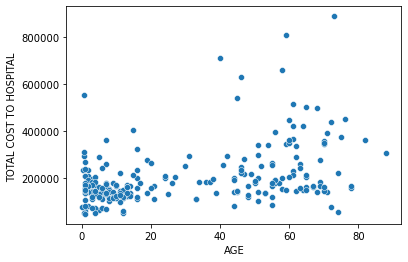

In [7]:
sns.scatterplot(df['AGE'], df['TOTAL COST TO HOSPITAL '])

<AxesSubplot:ylabel='Density'>

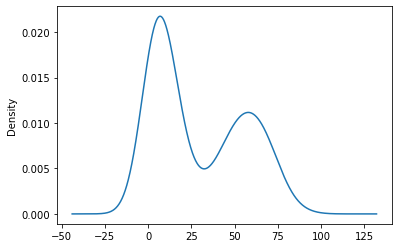

In [9]:
df['AGE'].plot.kde()

In [14]:
df.columns

Index(['SL.', 'AGE', 'GENDER', 'MARITAL STATUS', 'KEY COMPLAINTS -CODE',
       'BODY WEIGHT', 'BODY HEIGHT', 'HR PULSE', 'BP -HIGH', 'BP-LOW', 'RR',
       'PAST MEDICAL HISTORY CODE', 'HB', 'UREA', 'CREATININE',
       'MODE OF ARRIVAL', 'STATE AT THE TIME OF ARRIVAL', 'TYPE OF ADMSN',
       'TOTAL LENGTH OF STAY', 'LENGTH OF STAY - ICU', 'LENGTH OF STAY- WARD',
       'IMPLANT USED (Y/N)', 'COST OF IMPLANT', 'TOTAL COST TO HOSPITAL '],
      dtype='object')

In [17]:
groupped = df.groupby('GENDER')['TOTAL COST TO HOSPITAL '].mean()

In [19]:
groupped.values

array([172111.92390244, 211868.72379518])

In [147]:
df['GENDER'].value_counts()

M    166
F     82
Name: GENDER, dtype: int64

<AxesSubplot:xlabel='AGE', ylabel='Density'>

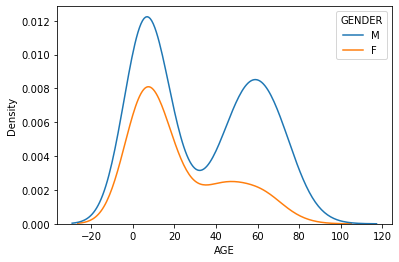

In [149]:
sns.kdeplot(df['AGE'],hue = df['GENDER'])

<AxesSubplot:xlabel='GENDER'>

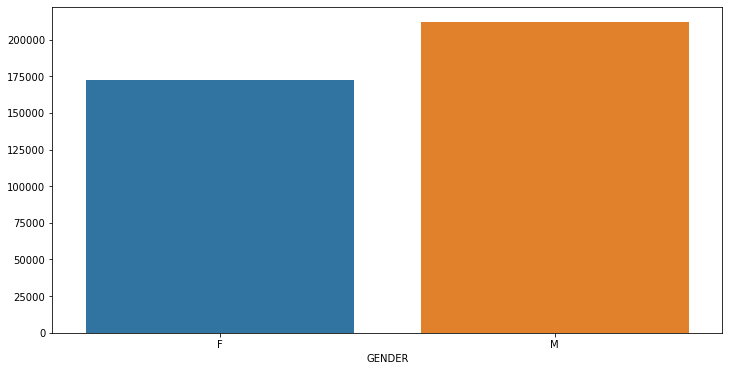

In [23]:
plt.figure(figsize=(12,6))
sns.barplot(y = groupped.values, x = groupped.index)

In [26]:
df['MARITAL STATUS'].value_counts()

UNMARRIED    140
MARRIED      108
Name: MARITAL STATUS, dtype: int64

In [27]:
group_2 = df.groupby('MARITAL STATUS')['TOTAL COST TO HOSPITAL '].mean()

group_2

MARITAL STATUS
MARRIED      250975.247315
UNMARRIED    158414.708571
Name: TOTAL COST TO HOSPITAL , dtype: float64

In [155]:
df.groupby([pd.cut(df['AGE'], bins = 3),'PAST MEDICAL HISTORY CODE']).count()

SL.  AGE  GENDER  MARITAL STATUS  \
AGE               PAST MEDICAL HISTORY CODE                                     
(-0.0551, 29.355] Diabetes1                    0    0       0               0   
                  Diabetes2                    1    1       1               1   
                  Hypertension1                0    0       0               0   
                  hypertension1                0    0       0               0   
                  hypertension2                3    3       3               3   
                  hypertension3                0    0       0               0   
                  other                       13   13      13              13   
(29.355, 58.678]  Diabetes1                    5    5       5               5   
                  Diabetes2                    2    2       2               2   
                  Hypertension1                1    1       1               1   
                  hypertension1                7    7       7               7   
                  hypertension2                7    7       7               7   
                  hypertension3                2    2       2               2   
                  other                        1    1       1               1   
(58.678, 88.0]    Diabetes1                    5    5       5               5   
                  Diabetes2                    6    6       6               6   
                  Hypertension1                2    2       2               2   
                  hypertension1               13   13      13              13   
                  hypertension2                3    3       3               3   
                  hypertension3                3    3       3               3   
                  other                        1    1       1               1   

                                             KEY COMPLAINTS -CODE  \
AGE               PAST MEDICAL HISTORY CODE                         
(-0.0551, 29.355] Diabetes1                                     0   
                  Diabetes2                                     1   
                  Hypertension1                                 0   
                  hypertension1                                 0   
                  hypertension2                                 2   
                  hypertension3                                 0   
                  other                                        12   
(29.355, 58.678]  Diabetes1                                     5   
                  Diabetes2                                     2   
                  Hypertension1                                 1   
                  hypertension1                                 7   
                  hypertension2                                 4   
                  hypertension3                                 0   
                  other                                         1   
(58.678, 88.0]    Diabetes1                                     5   
                  Diabetes2                                     6   
                  Hypertension1                                 1   
                  hypertension1                                10   
                  hypertension2                                 3   
                  hypertension3                                 3   
                  other                                         1   

                                             BODY WEIGHT  BODY HEIGHT  \
AGE               PAST MEDICAL HISTORY CODE                             
(-0.0551, 29.355] Diabetes1                            0            0   
                  Diabetes2                            1            1   
                  Hypertension1                        0            0   
                  hypertension1                        0            0   
                  hypertension2                        3            3   
                  hypertension3                        0            0   
         

**Observation:**
* Married people's total cost to hospital is higher.

In [29]:
df['KEY COMPLAINTS -CODE'].value_counts()

other- heart          55
CAD-DVD               27
RHD                   26
CAD-TVD               24
ACHD                  19
other-tertalogy       18
OS-ASD                15
other- respiratory    15
PM-VSD                 6
other-nervous          3
CAD-SVD                2
CAD-VSD                1
other-general          1
Name: KEY COMPLAINTS -CODE, dtype: int64

In [156]:
df.groupby([pd.cut(df['AGE'], bins = 3),'KEY COMPLAINTS -CODE']).count()

SL.  AGE  GENDER  MARITAL STATUS  \
AGE               KEY COMPLAINTS -CODE                                     
(-0.0551, 29.355] ACHD                   14   14      14              14   
                  CAD-DVD                 0    0       0               0   
                  CAD-SVD                 0    0       0               0   
                  CAD-TVD                 1    1       1               1   
                  CAD-VSD                 1    1       1               1   
                  OS-ASD                 13   13      13              13   
                  PM-VSD                  6    6       6               6   
                  RHD                    12   12      12              12   
                  other- heart           42   42      42              42   
                  other- respiratory     14   14      14              14   
                  other-general           0    0       0               0   
                  other-nervous           3    3       3               3   
                  other-tertalogy        18   18      18              18   
(29.355, 58.678]  ACHD                    4    4       4               4   
                  CAD-DVD                12   12      12              12   
                  CAD-SVD                 1    1       1               1   
                  CAD-TVD                 9    9       9               9   
                  CAD-VSD                 0    0       0               0   
                  OS-ASD                  2    2       2               2   
                  PM-VSD                  0    0       0               0   
                  RHD                    11   11      11              11   
                  other- heart            6    6       6               6   
                  other- respiratory      0    0       0               0   
                  other-general           0    0       0               0   
                  other-nervous           0    0       0               0   
                  other-tertalogy         0    0       0               0   
(58.678, 88.0]    ACHD                    1    1       1               1   
                  CAD-DVD                15   15      15              15   
                  CAD-SVD                 1    1       1               1   
                  CAD-TVD                14   14      14              14   
                  CAD-VSD                 0    0       0               0   
                  OS-ASD                  0    0       0               0   
                  PM-VSD                  0    0       0               0   
                  RHD                     3    3       3               3   
                  other- heart            7    7       7               7   
                  other- respiratory      1    1       1               1   
                  other-general           1    1       1               1   
                  other-nervous           0    0       0               0   
                  other-tertalogy         0    0       0               0   

                                        BODY WEIGHT  BODY HEIGHT  HR PULSE  \
AGE               KEY COMPLAINTS -CODE                                       
(-0.0551, 29.355] ACHD                           14           14        14   
                  CAD-DVD                         0            0         0   
                  CAD-SVD                         0            0         0   
                  CAD-TVD                         1            1         1   
                  CAD-VSD                         1            1         1   
                  OS-ASD                         13           13        13   
                  PM-VSD                          6            6         6   
                  RHD                            12           12        12   
                  other- heart                   42           42        42   
                  other- respiratory             14           14 

In [30]:
group_3 = df.groupby('KEY COMPLAINTS -CODE')['TOTAL COST TO HOSPITAL '].mean()

group_3

KEY COMPLAINTS -CODE
ACHD                  128507.335789
CAD-DVD               310210.698519
CAD-SVD               269220.915000
CAD-TVD               278512.165000
CAD-VSD               140545.000000
OS-ASD                141141.174000
PM-VSD                144657.500000
RHD                   255411.163846
other- heart          189239.441818
other- respiratory    153260.044667
other-general          55885.700000
other-nervous         158139.166667
other-tertalogy       167761.788333
Name: TOTAL COST TO HOSPITAL , dtype: float64

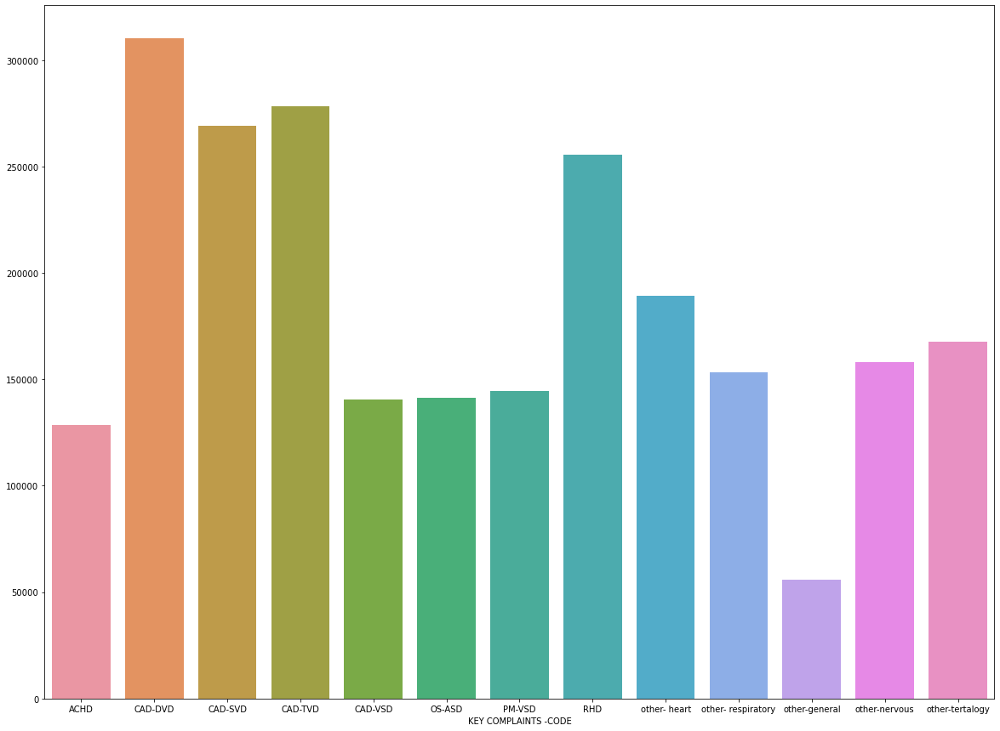

In [33]:
plt.figure(figsize=(20,15))
sns.barplot(y = group_3.values, x = group_3.index);

**Observation:**
* CAD DVD has the highest total cost to hospital.

In [35]:
df['BODY WEIGHT'].nunique()

148

<AxesSubplot:xlabel='BODY WEIGHT', ylabel='TOTAL COST TO HOSPITAL '>

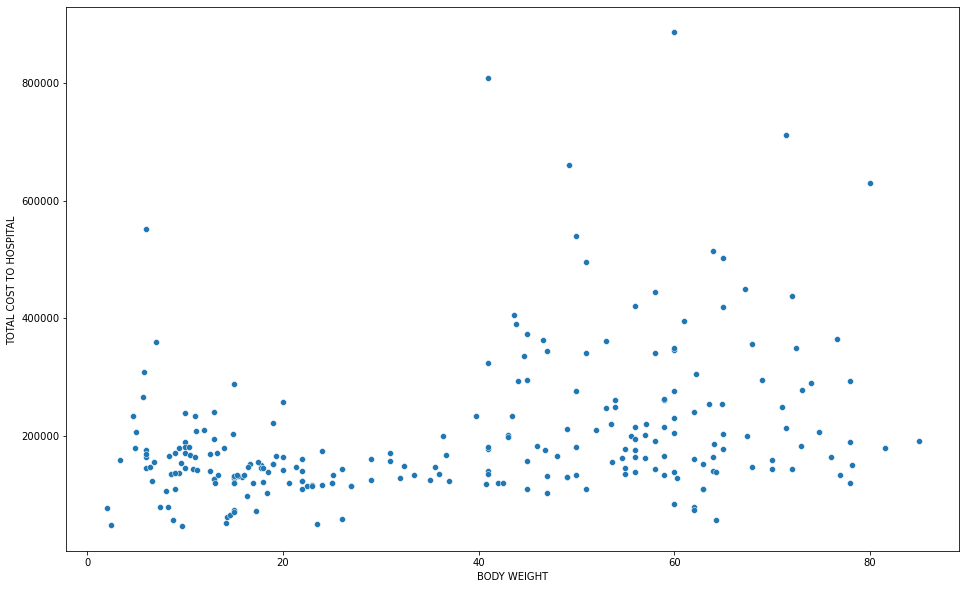

In [37]:
plt.figure(figsize = (16,10))
sns.scatterplot(x = df['BODY WEIGHT'], y = df['TOTAL COST TO HOSPITAL '])

<AxesSubplot:ylabel='Density'>

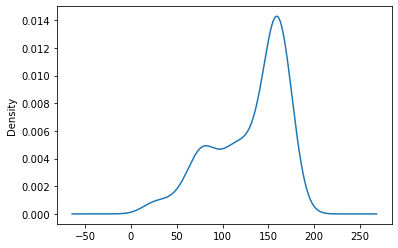

In [40]:
df['BODY HEIGHT'].plot.kde()

<AxesSubplot:ylabel='Density'>

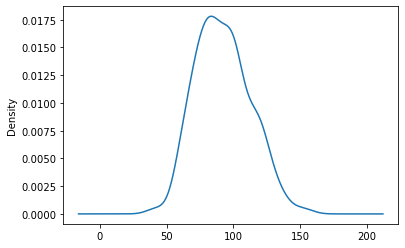

In [42]:
df['HR PULSE'].plot.kde()

<AxesSubplot:ylabel='Density'>

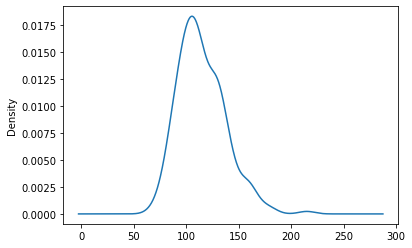

In [43]:
df['BP -HIGH'].plot.kde()

In [45]:
df['BP-LOW'].nunique()

27

<AxesSubplot:ylabel='Density'>

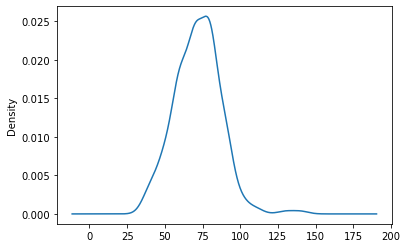

In [46]:
df['BP-LOW'].plot.kde()

In [48]:
df['RR'].nunique()

22

<AxesSubplot:ylabel='Density'>

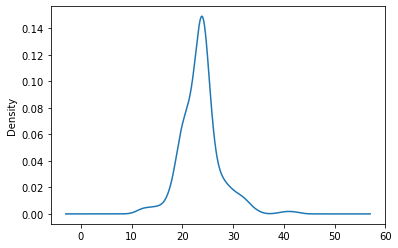

In [49]:
df['RR'].plot.kde()

In [53]:
group_4 = df.groupby('PAST MEDICAL HISTORY CODE')['TOTAL COST TO HOSPITAL '].mean()

<AxesSubplot:xlabel='PAST MEDICAL HISTORY CODE'>

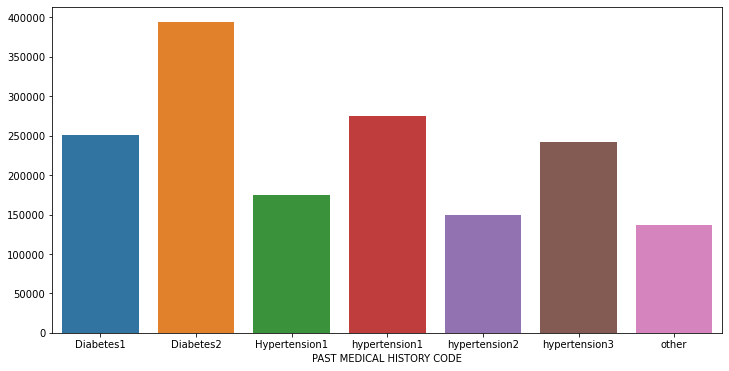

In [54]:
plt.figure(figsize=(12,6))
sns.barplot(y = group_4.values, x = group_4.index)

<AxesSubplot:ylabel='Density'>

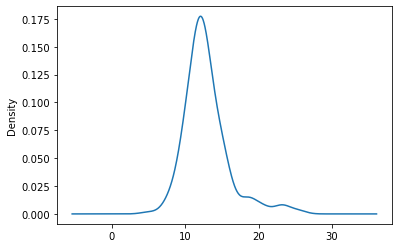

In [56]:
df['HB'].plot.kde()

/Applications/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='UREA', ylabel='Density'>

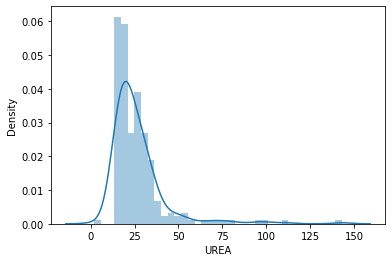

In [58]:
sns.distplot(df['UREA'])

<AxesSubplot:ylabel='Density'>

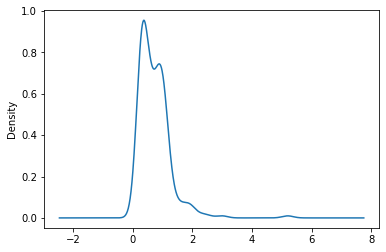

In [59]:
df['CREATININE'].plot.kde()

In [61]:
group_5 = df.groupby(['MODE OF ARRIVAL'])['TOTAL COST TO HOSPITAL '].mean()

group_5

MODE OF ARRIVAL
AMBULANCE      315382.537333
TRANSFERRED    126685.937500
WALKED IN      183715.729159
Name: TOTAL COST TO HOSPITAL , dtype: float64

<AxesSubplot:xlabel='MODE OF ARRIVAL'>

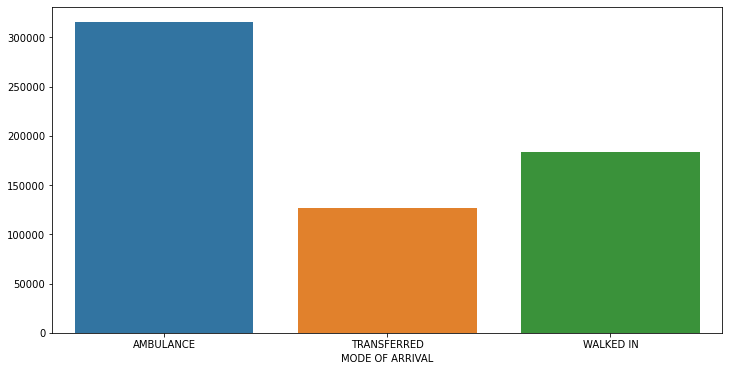

In [62]:
plt.figure(figsize=(12,6))
sns.barplot(y = group_5.values, x = group_5.index)

#### Observation

* Mode of travel Ambulance has highest Total Cost To hospital.

In [64]:
group_6 = df.groupby(['STATE AT THE TIME OF ARRIVAL'])['TOTAL COST TO HOSPITAL '].mean()

group_6

STATE AT THE TIME OF ARRIVAL
ALERT       198113.635263
CONFUSED    349318.000000
Name: TOTAL COST TO HOSPITAL , dtype: float64

<AxesSubplot:xlabel='STATE AT THE TIME OF ARRIVAL'>

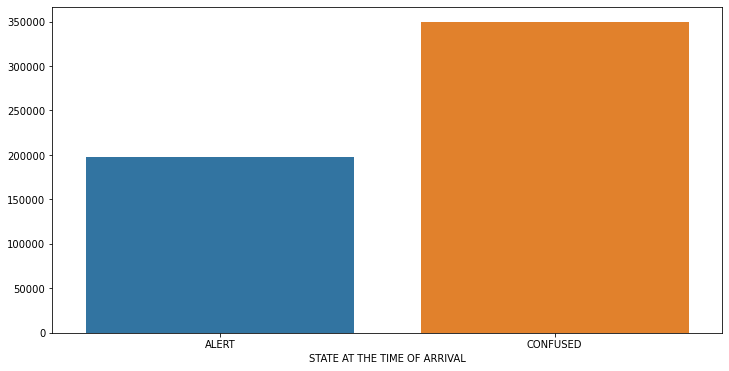

In [65]:
plt.figure(figsize=(12,6))
sns.barplot(y = group_6.values, x = group_6.index)

In [67]:
group_7 = df.groupby(['TYPE OF ADMSN'])['TOTAL COST TO HOSPITAL '].mean()

group_7

TYPE OF ADMSN
ELECTIVE     182081.226574
EMERGENCY    311057.530312
Name: TOTAL COST TO HOSPITAL , dtype: float64

<AxesSubplot:xlabel='TYPE OF ADMSN'>

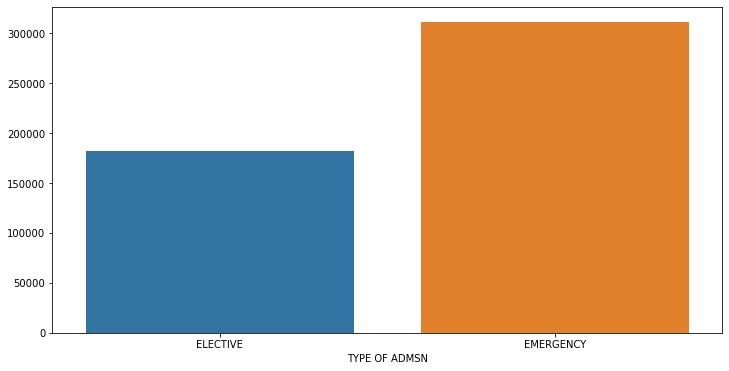

In [68]:
plt.figure(figsize=(12,6))
sns.barplot(y = group_7.values, x = group_7.index)

**Observation:**
* Emergency patients have higher total cost to hospital.

In [70]:
df['TOTAL LENGTH OF STAY'].nunique()

27

In [74]:
group_8 = df.groupby(['TOTAL LENGTH OF STAY'])['TOTAL COST TO HOSPITAL '].mean()

<AxesSubplot:xlabel='TOTAL LENGTH OF STAY'>

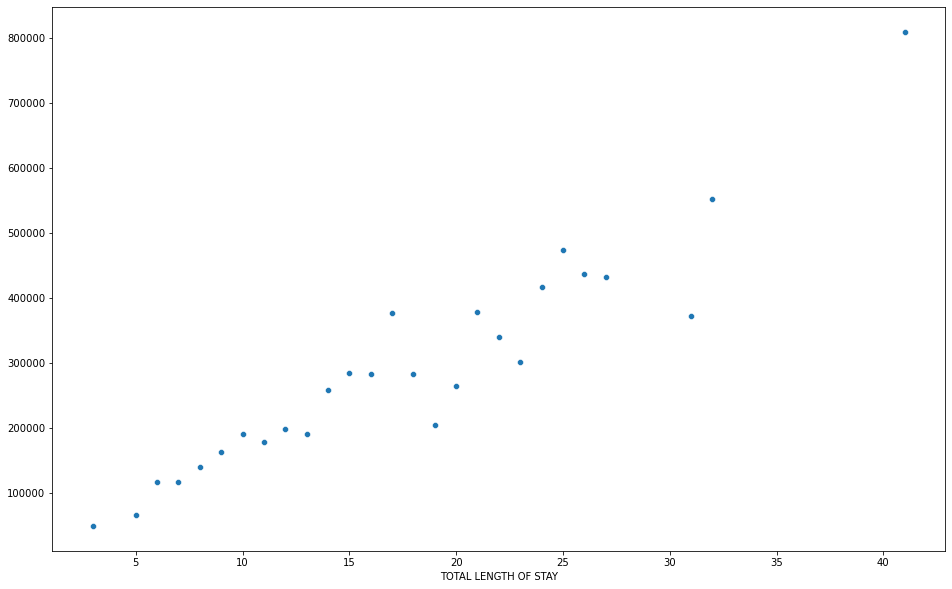

In [76]:
plt.figure(figsize=(16,10))
sns.scatterplot(x = group_8.index, y = group_8.values)
#Higher the total length of stay, higher the total cost of hospital.

In [77]:
group_9 = df.groupby(['LENGTH OF STAY - ICU'])['TOTAL COST TO HOSPITAL '].mean()
group_9

LENGTH OF STAY - ICU
0     103475.733333
1     127537.912987
2     162250.480758
3     174679.401562
4     221573.331765
5     255341.564286
6     236289.502222
8     247335.000000
9     363029.345000
10    478386.600000
11    389998.000000
12    455032.600000
13    539692.500000
15    576296.500000
16    495968.700000
20    809130.000000
22    539976.000000
30    551809.000000
Name: TOTAL COST TO HOSPITAL , dtype: float64

<AxesSubplot:xlabel='LENGTH OF STAY - ICU'>

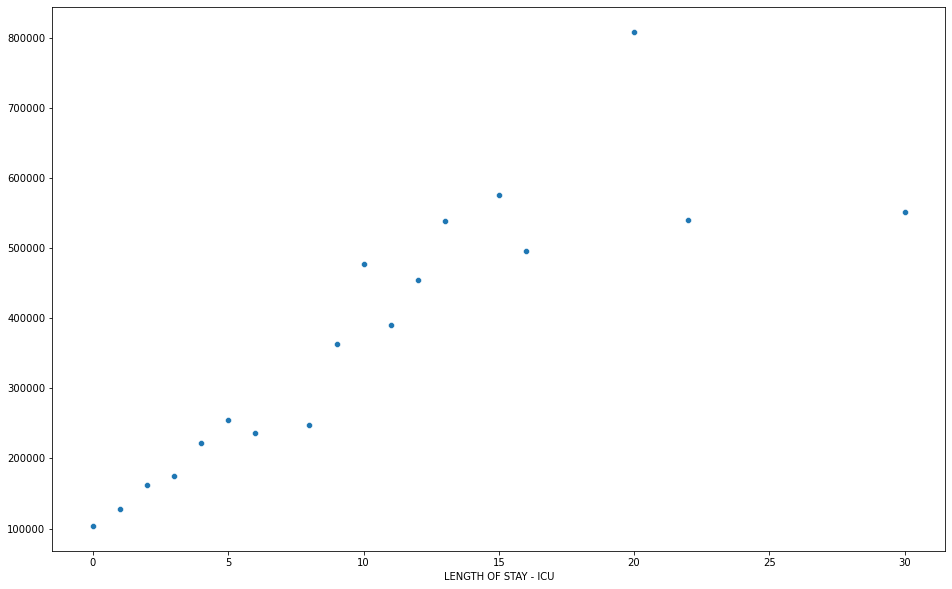

In [79]:
plt.figure(figsize=(16,10))
sns.scatterplot(x = group_9.index, y = group_9.values)
#Higher the LENGTH OF STAY - ICU, higher the total cost of hospital.

<AxesSubplot:xlabel='LENGTH OF STAY - ICU'>

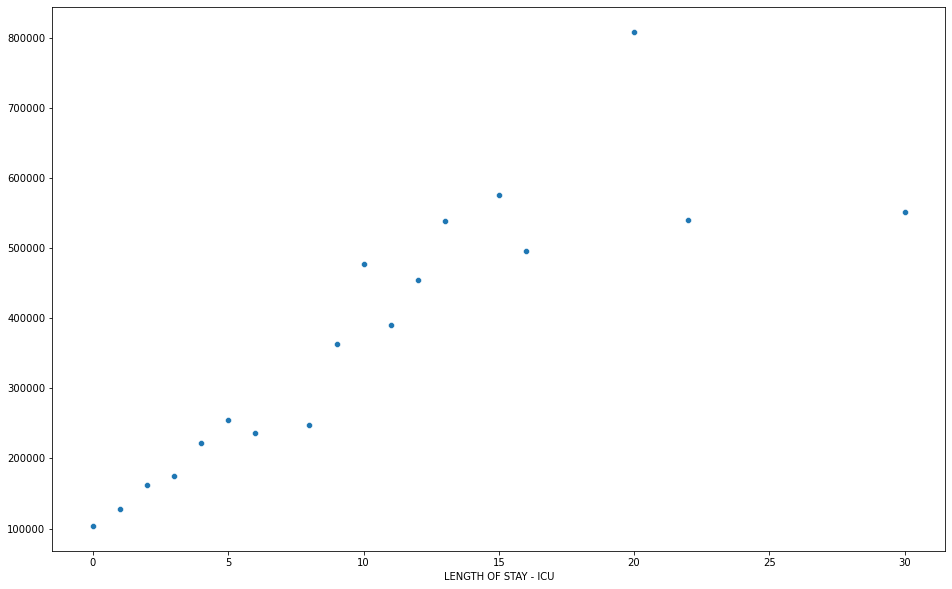

In [82]:
group_10 = df.groupby(['LENGTH OF STAY- WARD'])['TOTAL COST TO HOSPITAL '].mean()
plt.figure(figsize=(16,10))
sns.scatterplot(x = group_9.index, y = group_9.values)
#Higher the LENGTH OF STAY - ICU, higher the total cost of hospital.

In [87]:
group_11 = df.groupby(['IMPLANT USED (Y/N)'])['TOTAL COST TO HOSPITAL '].mean()

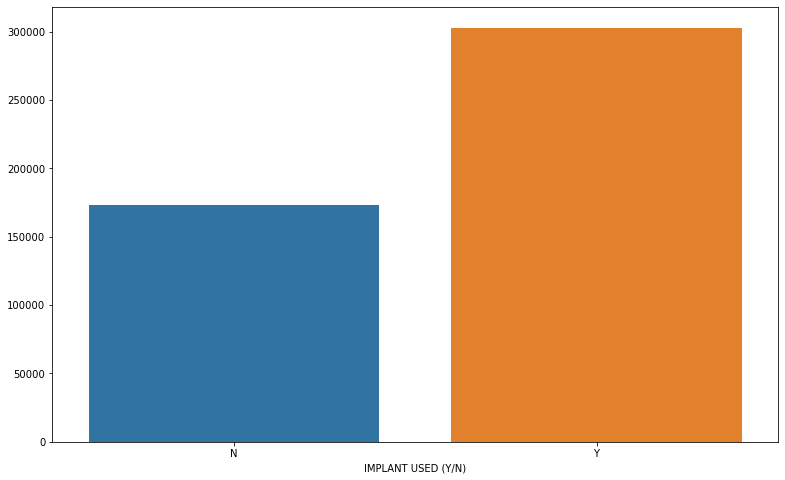

In [93]:
plt.figure(figsize=(13,8))
sns.barplot(x = group_11.index, y = group_11.values);

**Observation:**
* Implant used patients have higher total cost compared to no implant used

In [96]:
corr = df.corr()

corr

,SL.,AGE,BODY WEIGHT,BODY HEIGHT,HR PULSE,BP -HIGH,BP-LOW,RR,HB,UREA,CREATININE,TOTAL LENGTH OF STAY,LENGTH OF STAY - ICU,LENGTH OF STAY- WARD,COST OF IMPLANT,TOTAL COST TO HOSPITAL
SL.,1.000000,-0.324239,-0.243981,-0.216327,0.058443,-0.129061,-0.118160,-0.121831,0.103770,-0.174034,-0.430490,-0.407325,-0.448393,-0.120290,-0.099933,-0.498937
AGE,-0.324239,1.000000,0.848397,0.717492,-0.483498,0.608032,0.468121,-0.284377,-0.132305,0.231687,0.602261,0.215110,0.345183,-0.051822,0.182169,0.420697
BODY WEIGHT,-0.243981,0.848397,1.000000,0.849963,-0.564886,0.617656,0.511921,-0.316843,-0.086965,0.172141,0.585587,0.053802,0.228660,-0.159878,0.277585,0.348270
BODY HEIGHT,-0.216327,0.717492,0.849963,1.000000,-0.535004,0.512494,0.435541,-0.300503,-0.055917,0.162902,0.523436,0.002191,0.137965,-0.139425,0.277072,0.293828
HR PULSE,0.058443,-0.483498,-0.564886,-0.535004,1.000000,-0.317527,-0.218276,0.398739,0.028690,-0.024554,-0.385274,0.123733,0.041949,0.136957,-0.073423,-0.008536
BP -HIGH,-0.129061,0.608032,0.617656,0.512494,-0.317527,1.000000,0.766872,-0.134212,-0.061382,0.052586,0.394862,0.043380,0.152384,-0.095080,0.035315,0.182876
BP-LOW,-0.118160,0.468121,0.511921,0.435541,-0.218276,0.766872,1.000000,-0.076422,0.042393,0.024781,0.210442,0.016697,0.096495,-0.074687,0.079318,0.158195
RR,-0.121831,-0.284377,-0.316843,-0.300503,0.398739,-0.134212,-0.076422,1.000000,0.005896,0.041773,-0.233838,0.175510,0.055049,0.199682,-0.021318,0.016181
HB,0.103770,-0.132305,-0.086965,-0.055917,0.028690,-0.061382,0.042393,0.005896,1.000000,-0.073737,-0.178332,0.012601,-0.090243,0.115520,-0.089840,-0.061601
UREA,-0.174034,0.231687,0.172141,0.162902,-0.024554,0.052586,0.024781,0.041773,-0.073737,1.000000,0.558106,0.224382,0.234746,0.082015,0.252324,0.276581


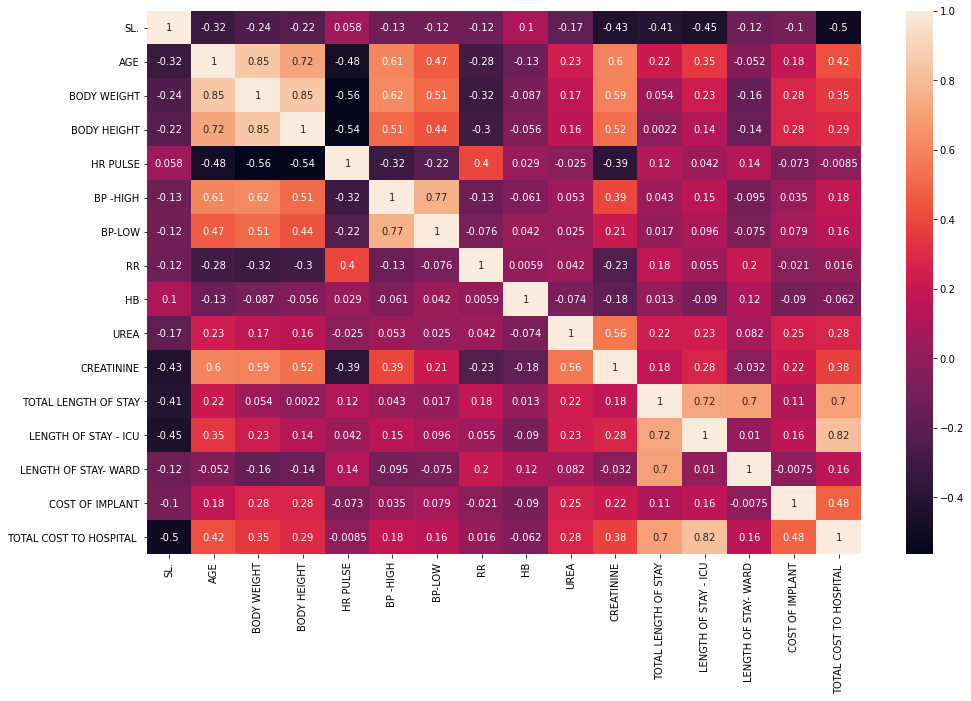

In [100]:
plt.figure(figsize=(16,10))
sns.heatmap(corr, annot=True, linecolor='w');

In [109]:
def scatter(x,y):
    plt.figure(figsize=(16,10))
    sns.scatterplot(x = df[x],y = df[y])
    plt.show()

In [104]:
df.columns

Index(['SL.', 'AGE', 'GENDER', 'MARITAL STATUS', 'KEY COMPLAINTS -CODE',
       'BODY WEIGHT', 'BODY HEIGHT', 'HR PULSE', 'BP -HIGH', 'BP-LOW', 'RR',
       'PAST MEDICAL HISTORY CODE', 'HB', 'UREA', 'CREATININE',
       'MODE OF ARRIVAL', 'STATE AT THE TIME OF ARRIVAL', 'TYPE OF ADMSN',
       'TOTAL LENGTH OF STAY', 'LENGTH OF STAY - ICU', 'LENGTH OF STAY- WARD',
       'IMPLANT USED (Y/N)', 'COST OF IMPLANT', 'TOTAL COST TO HOSPITAL '],
      dtype='object')

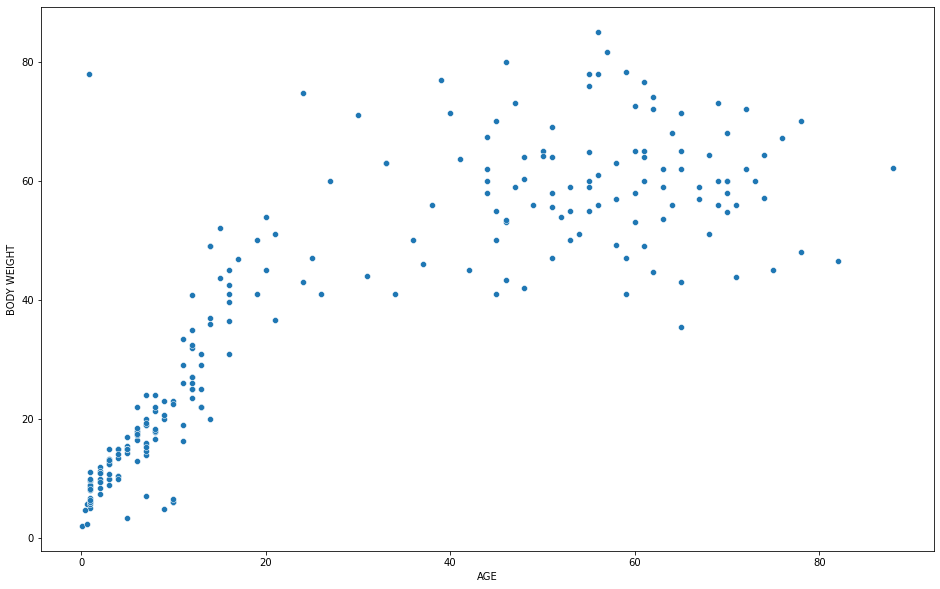

In [110]:
scatter('AGE', 'BODY WEIGHT')
#Body weight increases upto age 20 and then it reaches saturation level.

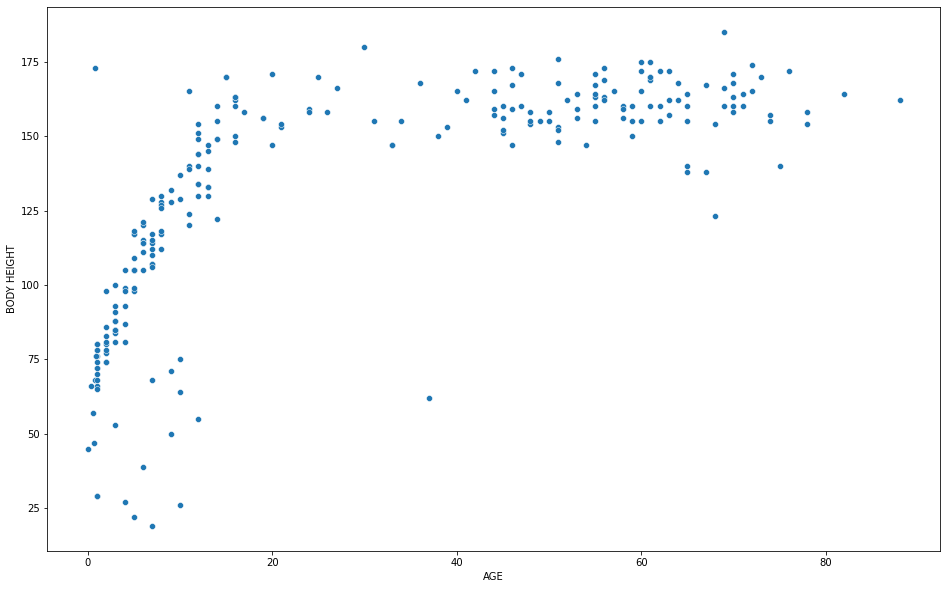

In [111]:
scatter('AGE', 'BODY HEIGHT')
#Similarly body weight increases exponentially upto the age of 20 and then it reaches saturation level.

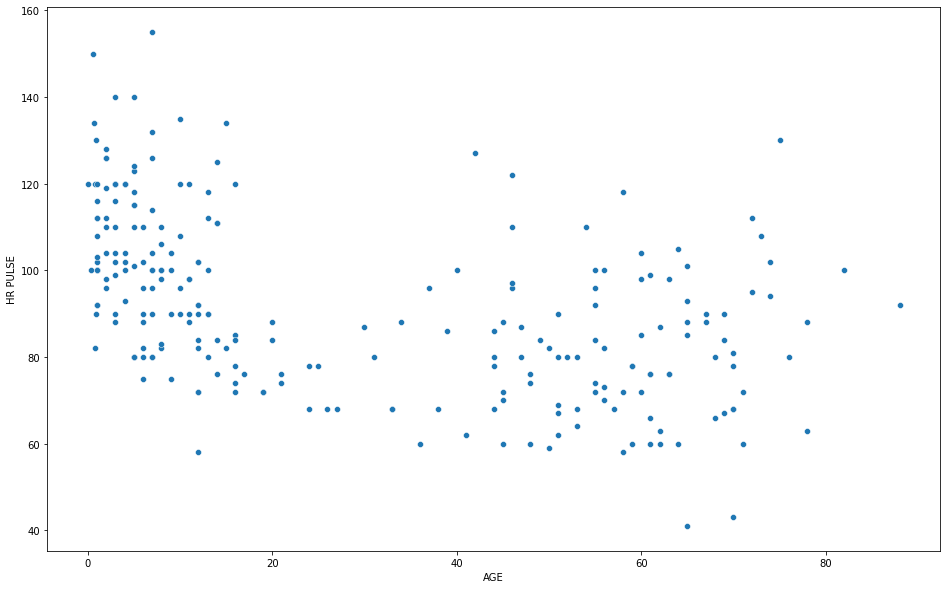

In [113]:
scatter('AGE', 'HR PULSE')
#Higher the age, lower the HR Pulse

In [114]:
df['BP -HIGH']

0      100.0
1       70.0
2      110.0
3      110.0
4      180.0
       ...  
243    130.0
244    100.0
245    150.0
246    100.0
247    130.0
Name: BP -HIGH, Length: 248, dtype: float64

In [116]:
def group(x, y):
    group = df.groupby(x)[y].mean()
    plt.figure(figsize=(16,10))
    sns.barplot(x = group.index, y = group.values)

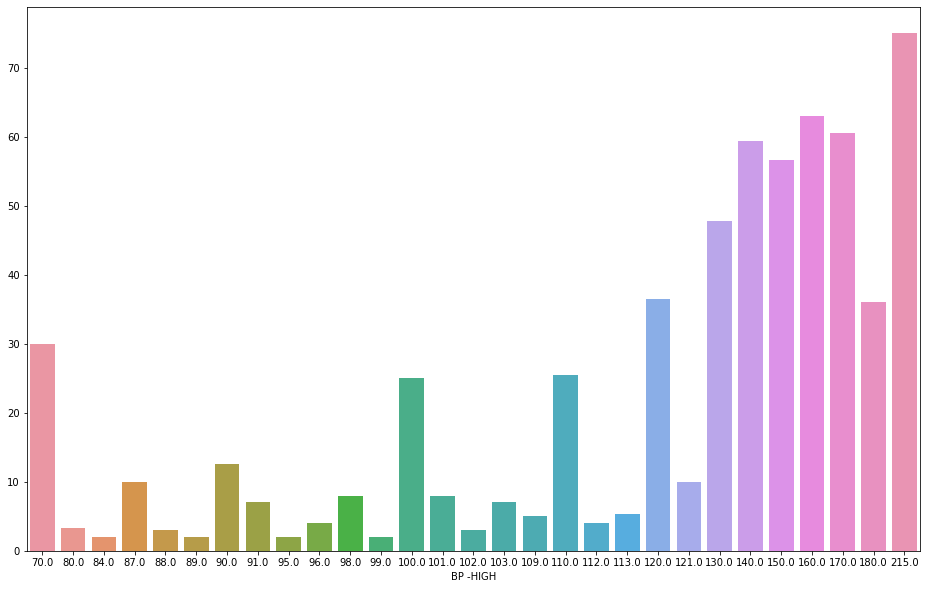

In [119]:
group('BP -HIGH', 'AGE')
#High BP patients belongs to high age group.

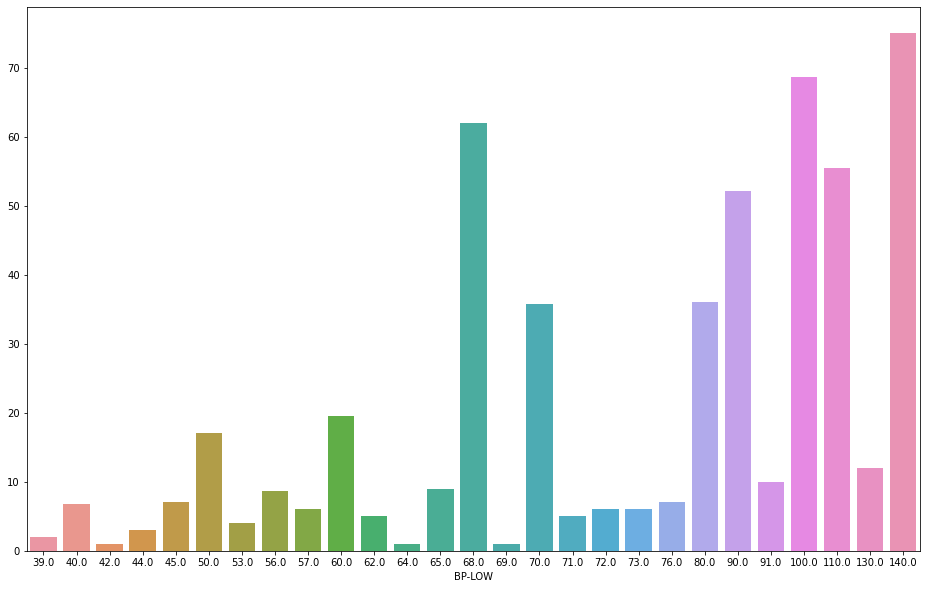

In [122]:
group('BP-LOW', 'AGE')
#Higher the age, higher the bp range.

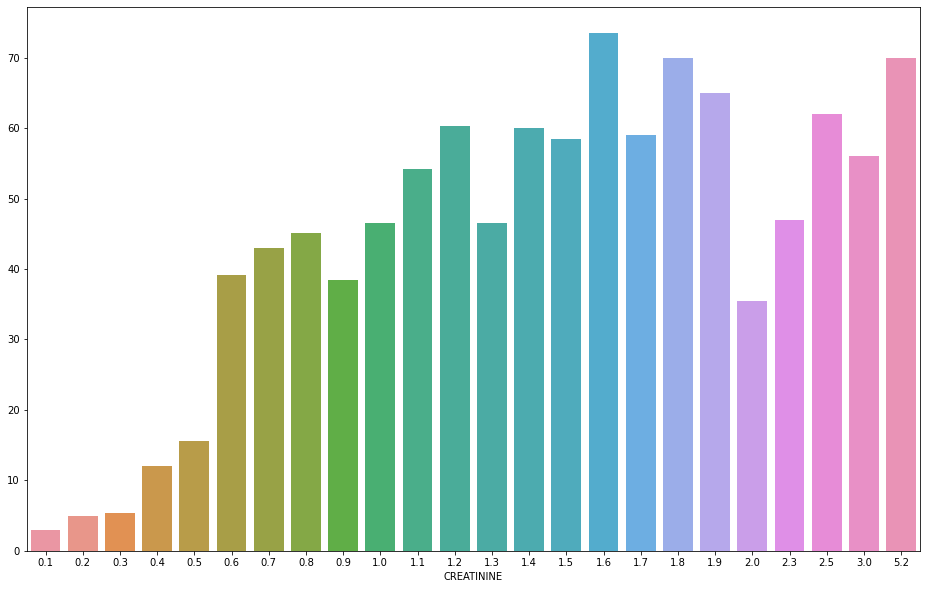

In [126]:
group('CREATININE', 'AGE')
#Higher the age, higher the creatinine level.

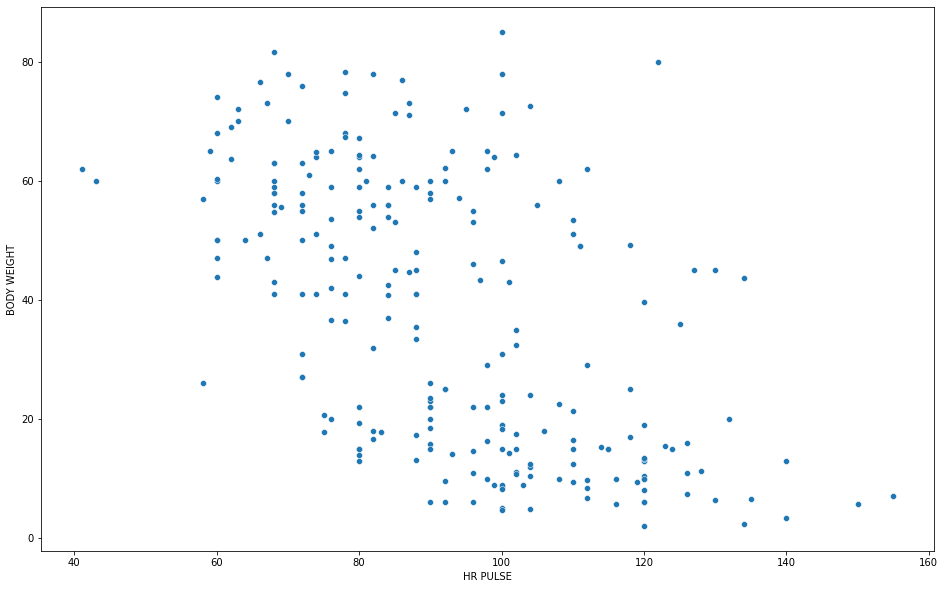

In [127]:
scatter('HR PULSE', 'BODY WEIGHT')
#Higher the HR Pulse, lower the body weight.

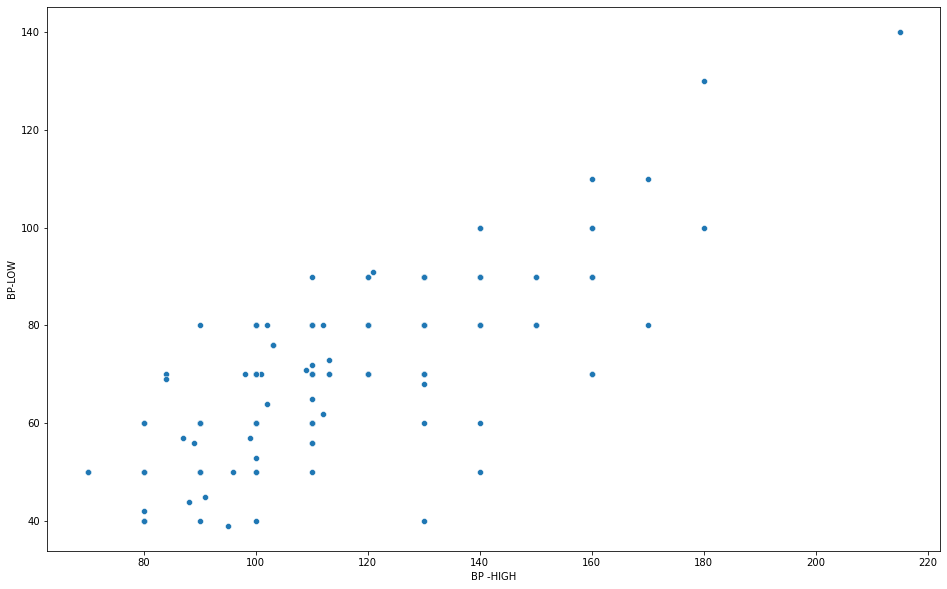

In [131]:
scatter('BP -HIGH', 'BP-LOW')

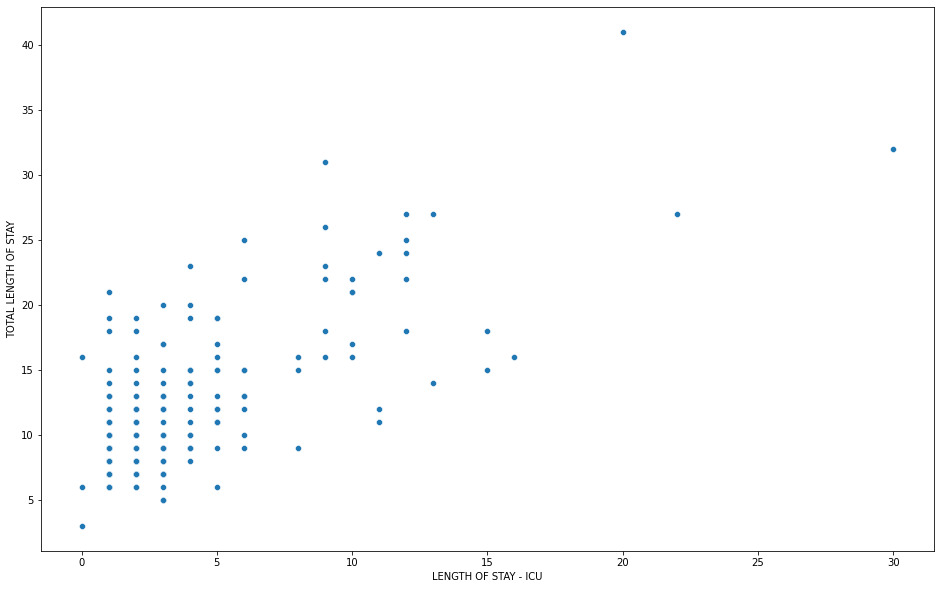

In [137]:
scatter('LENGTH OF STAY - ICU', 'TOTAL LENGTH OF STAY')
#Higher the total length of stay, higher the length of stay in ICU

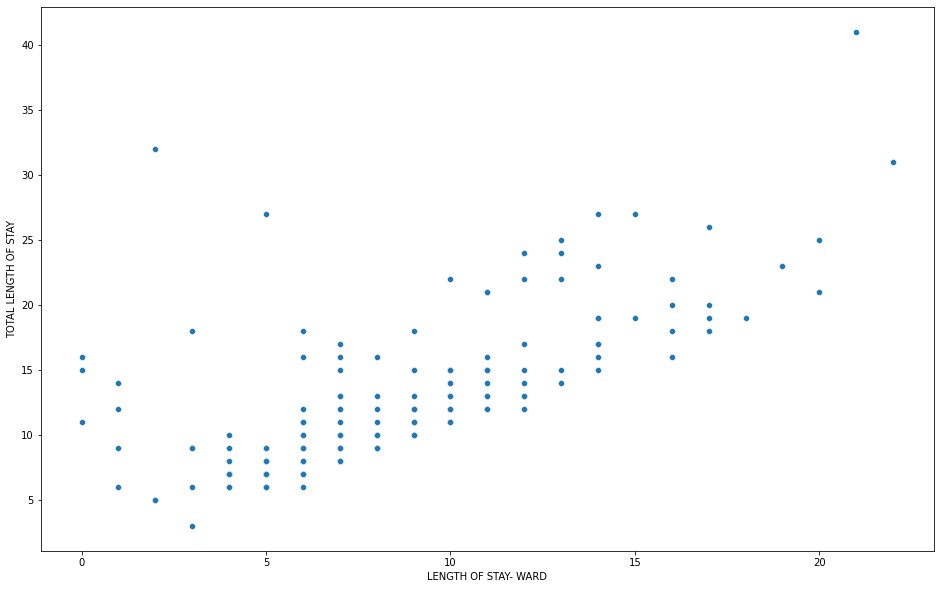

In [136]:
scatter('LENGTH OF STAY- WARD', 'TOTAL LENGTH OF STAY')
# Higher the length of stay ward, higher the total length of stay.

In [159]:
profile = ProfileReport(df)

In [161]:
profile

#### Feature Engineering

In [162]:
df.isna().sum()

SL.                               0
AGE                               0
GENDER                            0
MARITAL STATUS                    0
KEY COMPLAINTS -CODE             36
BODY WEIGHT                       0
BODY HEIGHT                       0
HR PULSE                          0
BP -HIGH                         23
BP-LOW                           23
RR                                0
PAST MEDICAL HISTORY CODE       173
HB                                2
UREA                             13
CREATININE                       33
MODE OF ARRIVAL                   0
STATE AT THE TIME OF ARRIVAL      0
TYPE OF ADMSN                     0
TOTAL LENGTH OF STAY              0
LENGTH OF STAY - ICU              0
LENGTH OF STAY- WARD              0
IMPLANT USED (Y/N)                0
COST OF IMPLANT                   0
TOTAL COST TO HOSPITAL            0
dtype: int64

In [203]:
df[df['KEY COMPLAINTS -CODE'].isna()]

,SL.,AGE,GENDER,MARITAL STATUS,KEY COMPLAINTS -CODE,BODY WEIGHT,BODY HEIGHT,HR PULSE,BP -HIGH,BP-LOW,RR,PAST MEDICAL HISTORY CODE,HB,UREA,CREATININE,MODE OF ARRIVAL,STATE AT THE TIME OF ARRIVAL,TYPE OF ADMSN,TOTAL LENGTH OF STAY,LENGTH OF STAY - ICU,LENGTH OF STAY- WARD,IMPLANT USED (Y/N),COST OF IMPLANT,TOTAL COST TO HOSPITAL
13,14,64.0,M,MARRIED,NaN,56.0,168,105,130.0,80.0,22,NaN,14.0,2.0,1.0,WALKED IN,ALERT,ELECTIVE,21,10,11,N,0,420040.00
39,40,67.0,M,MARRIED,NaN,57.0,167,90,120.0,80.0,24,NaN,15.0,24.0,1.0,WALKED IN,ALERT,ELECTIVE,13,4,9,N,0,162364.00
43,44,50.0,M,MARRIED,NaN,65.0,155,59,120.0,70.0,20,NaN,16.0,26.0,1.0,AMBULANCE,ALERT,EMERGENCY,14,3,11,N,0,178100.00
45,46,78.0,M,MARRIED,NaN,48.0,158,88,120.0,70.0,20,hypertension1,12.0,18.0,1.0,WALKED IN,ALERT,ELECTIVE,11,4,7,N,0,164719.00
46,47,39.0,F,MARRIED,NaN,77.0,153,86,130.0,80.0,26,NaN,13.0,21.0,1.0,WALKED IN,ALERT,ELECTIVE,8,2,6,N,0,133130.00
47,48,64.0,M,MARRIED,NaN,68.0,162,60,130.0,90.0,24,hypertension1,14.0,22.0,1.0,WALKED IN,ALERT,ELECTIVE,9,2,7,N,0,146308.60
48,49,53.0,M,MARRIED,NaN,55.0,156,80,140.0,80.0,20,hypertension3,13.0,20.0,1.0,WALKED IN,ALERT,ELECTIVE,8,2,6,N,0,134497.65
50,51,55.0,M,MARRIED,NaN,78.0,163,100,140.0,90.0,22,NaN,15.0,24.0,1.0,WALKED IN,ALERT,ELECTIVE,8,1,7,N,0,120131.00
51,52,56.0,M,MARRIED,NaN,56.0,162,82,150.0,80.0,24,hypertension2,10.0,42.0,3.0,TRANSFERRED,ALERT,ELECTIVE,14,2,12,N,0,176340.75
53,54,48.0,M,MARRIED,NaN,64.0,158,74,120.0,70.0,22,hypertension2,12.0,28.0,1.0,WALKED IN,ALERT,ELECTIVE,9,2,7,N,0,162957.32


In [164]:
df['KEY COMPLAINTS -CODE'].value_counts()

other- heart          55
CAD-DVD               27
RHD                   26
CAD-TVD               24
ACHD                  19
other-tertalogy       18
OS-ASD                15
other- respiratory    15
PM-VSD                 6
other-nervous          3
CAD-SVD                2
CAD-VSD                1
other-general          1
Name: KEY COMPLAINTS -CODE, dtype: int64

In [174]:
df.groupby('MARITAL STATUS')['KEY COMPLAINTS -CODE'].value_counts()

MARITAL STATUS  KEY COMPLAINTS -CODE
MARRIED         CAD-DVD                 25
                CAD-TVD                 24
                RHD                     15
                other- heart            15
                ACHD                     5
                CAD-SVD                  2
                OS-ASD                   2
                other- respiratory       1
                other-general            1
UNMARRIED       other- heart            40
                other-tertalogy         18
                ACHD                    14
                other- respiratory      14
                OS-ASD                  13
                RHD                     11
                PM-VSD                   6
                other-nervous            3
                CAD-DVD                  2
                CAD-VSD                  1
Name: KEY COMPLAINTS -CODE, dtype: int64

In [4]:
def impute():
    null_index = df[df['KEY COMPLAINTS -CODE'].isna()].index
    for i in null_index:
        if df.loc[i,'MARITAL STATUS'] == 'MARRIED':
            df.loc[i, 'KEY COMPLAINTS -CODE'] = 'CAD-DVD'
        else:
             df.loc[i, 'KEY COMPLAINTS -CODE'] = 'other- heart'
        

In [5]:
impute()

In [6]:
df.isna().sum()

SL.                               0
AGE                               0
GENDER                            0
MARITAL STATUS                    0
KEY COMPLAINTS -CODE              0
BODY WEIGHT                       0
BODY HEIGHT                       0
HR PULSE                          0
BP -HIGH                         23
BP-LOW                           23
RR                                0
PAST MEDICAL HISTORY CODE       173
HB                                2
UREA                             13
CREATININE                       33
MODE OF ARRIVAL                   0
STATE AT THE TIME OF ARRIVAL      0
TYPE OF ADMSN                     0
TOTAL LENGTH OF STAY              0
LENGTH OF STAY - ICU              0
LENGTH OF STAY- WARD              0
IMPLANT USED (Y/N)                0
COST OF IMPLANT                   0
TOTAL COST TO HOSPITAL            0
dtype: int64

In [7]:
df[df['BP -HIGH'].isna()]
#Only lesser age patients have null values in BP - HIGH and BP - LOW

,SL.,AGE,GENDER,MARITAL STATUS,KEY COMPLAINTS -CODE,BODY WEIGHT,BODY HEIGHT,HR PULSE,BP -HIGH,BP-LOW,RR,PAST MEDICAL HISTORY CODE,HB,UREA,CREATININE,MODE OF ARRIVAL,STATE AT THE TIME OF ARRIVAL,TYPE OF ADMSN,TOTAL LENGTH OF STAY,LENGTH OF STAY - ICU,LENGTH OF STAY- WARD,IMPLANT USED (Y/N),COST OF IMPLANT,TOTAL COST TO HOSPITAL
35,36,0.833333,M,UNMARRIED,other- heart,6.00,68,120,NaN,NaN,22,NaN,10.4,24.0,0.3,WALKED IN,ALERT,ELECTIVE,32,30,2,N,0,551809.00
64,65,11.000000,M,UNMARRIED,other- heart,26.00,140,90,NaN,NaN,20,NaN,12.0,18.0,1.0,WALKED IN,ALERT,ELECTIVE,8,1,7,N,0,142552.00
86,87,0.583333,F,UNMARRIED,other- respiratory,5.80,57,150,NaN,NaN,28,NaN,11.3,38.0,0.5,WALKED IN,ALERT,ELECTIVE,27,12,15,N,0,308817.00
89,90,3.000000,F,UNMARRIED,other- heart,9.00,81,99,NaN,NaN,20,NaN,12.9,17.0,0.3,WALKED IN,ALERT,ELECTIVE,18,1,17,N,0,109575.60
94,95,7.000000,M,UNMARRIED,other- heart,14.00,112,80,NaN,NaN,22,NaN,13.1,29.0,1.2,WALKED IN,ALERT,ELECTIVE,8,4,4,N,0,179720.00
130,131,14.000000,F,UNMARRIED,RHD,36.00,160,125,NaN,NaN,26,NaN,9.6,33.0,0.8,WALKED IN,ALERT,ELECTIVE,11,1,10,N,0,135216.00
131,132,12.000000,F,UNMARRIED,ACHD,40.80,154,84,NaN,NaN,20,NaN,11.7,18.0,0.7,WALKED IN,ALERT,ELECTIVE,7,1,6,N,0,117185.00
151,152,3.000000,M,UNMARRIED,other-tertalogy,10.80,91,102,NaN,NaN,20,NaN,10.8,25.0,0.4,WALKED IN,ALERT,ELECTIVE,9,1,8,N,0,143773.58
157,158,0.032877,M,UNMARRIED,other- respiratory,2.02,45,120,NaN,NaN,32,NaN,18.8,27.0,0.5,WALKED IN,ALERT,ELECTIVE,7,1,6,N,0,77241.00
161,162,5.000000,M,UNMARRIED,other- heart,15.00,105,110,NaN,NaN,32,NaN,12.4,32.0,0.2,WALKED IN,ALERT,ELECTIVE,25,6,20,N,0,288614.20


In [8]:
#Since teenage patients have null values in BP Column, I'm calculating mean values for teenage patients.
bp_mean = df[df['AGE']<=19].aggregate({'BP -HIGH': np.mean, 'BP-LOW': np.mean})
bp_mean

BP -HIGH    101.772727
BP-LOW       64.672727
dtype: float64

In [9]:
bp_mean[0]

101.77272727272727

In [10]:
#Replacing null values.
df['BP -HIGH'].fillna(bp_mean[0],inplace=True)

In [11]:
#Replacing null values.
df['BP-LOW'].fillna(bp_mean[1],inplace=True)

In [12]:
#Replacing null values by its respective mean value.
df['HB'].fillna(df['HB'].mean(), inplace=True)

In [13]:
df[df['CREATININE'].isna()]

,SL.,AGE,GENDER,MARITAL STATUS,KEY COMPLAINTS -CODE,BODY WEIGHT,BODY HEIGHT,HR PULSE,BP -HIGH,BP-LOW,RR,PAST MEDICAL HISTORY CODE,HB,UREA,CREATININE,MODE OF ARRIVAL,STATE AT THE TIME OF ARRIVAL,TYPE OF ADMSN,TOTAL LENGTH OF STAY,LENGTH OF STAY - ICU,LENGTH OF STAY- WARD,IMPLANT USED (Y/N),COST OF IMPLANT,TOTAL COST TO HOSPITAL
26,27,15.000000,M,UNMARRIED,RHD,43.6,170,134,110.000000,70.000000,40,NaN,9.900000,NaN,NaN,AMBULANCE,ALERT,EMERGENCY,22,10,12,Y,41800,404644.00
33,34,7.000000,M,UNMARRIED,other- respiratory,7.0,68,155,91.000000,45.000000,30,NaN,13.000000,16.0,NaN,WALKED IN,ALERT,ELECTIVE,22,12,10,N,0,359280.00
38,39,55.000000,M,MARRIED,CAD-TVD,76.0,155,72,130.000000,80.000000,28,hypertension2,13.000000,15.0,NaN,WALKED IN,ALERT,ELECTIVE,10,1,9,N,0,163765.00
44,45,3.000000,M,UNMARRIED,other- respiratory,10.0,85,120,88.000000,44.000000,24,NaN,8.000000,18.0,NaN,WALKED IN,ALERT,ELECTIVE,11,2,9,N,0,169726.43
49,50,1.000000,M,UNMARRIED,other-nervous,5.0,66,100,100.000000,70.000000,24,NaN,10.000000,50.0,NaN,WALKED IN,ALERT,ELECTIVE,15,6,9,N,0,206500.95
58,59,12.000000,F,UNMARRIED,other- heart,32.0,149,82,100.000000,50.000000,24,NaN,9.000000,15.0,NaN,WALKED IN,ALERT,ELECTIVE,6,2,4,N,0,128104.37
59,60,10.000000,F,UNMARRIED,other- heart,23.0,137,90,90.000000,60.000000,22,NaN,11.000000,18.0,NaN,WALKED IN,ALERT,ELECTIVE,9,1,8,N,0,115908.00
60,61,14.000000,F,UNMARRIED,other- heart,49.0,149,111,100.000000,80.000000,26,NaN,12.000000,33.0,NaN,WALKED IN,ALERT,ELECTIVE,7,3,4,N,0,129474.64
61,62,7.000000,M,UNMARRIED,other- heart,19.0,107,100,103.000000,76.000000,26,NaN,14.000000,17.0,NaN,WALKED IN,ALERT,ELECTIVE,10,2,8,N,0,152184.00
63,64,12.000000,F,UNMARRIED,other- heart,35.0,140,102,100.000000,70.000000,26,NaN,13.000000,18.0,NaN,WALKED IN,ALERT,ELECTIVE,9,1,8,N,0,124804.00


In [231]:
df

,SL.,AGE,GENDER,MARITAL STATUS,KEY COMPLAINTS -CODE,BODY WEIGHT,BODY HEIGHT,HR PULSE,BP -HIGH,BP-LOW,RR,PAST MEDICAL HISTORY CODE,HB,UREA,CREATININE,MODE OF ARRIVAL,STATE AT THE TIME OF ARRIVAL,TYPE OF ADMSN,TOTAL LENGTH OF STAY,LENGTH OF STAY - ICU,LENGTH OF STAY- WARD,IMPLANT USED (Y/N),COST OF IMPLANT,TOTAL COST TO HOSPITAL
0,1,58.0,M,MARRIED,other- heart,49.2,160,118,100.0,80.0,32,NaN,11.4,33.0,0.8,AMBULANCE,ALERT,EMERGENCY,25,12,13,Y,38000,660293.0
1,2,59.0,M,MARRIED,CAD-DVD,41.0,155,78,70.0,50.0,28,NaN,11.4,95.0,1.7,AMBULANCE,ALERT,EMERGENCY,41,20,21,Y,39690,809130.0
2,3,82.0,M,MARRIED,CAD-TVD,46.6,164,100,110.0,80.0,20,Diabetes2,11.8,15.0,0.8,WALKED IN,ALERT,ELECTIVE,18,9,9,N,0,362231.0
3,4,46.0,M,MARRIED,CAD-DVD,80.0,173,122,110.0,80.0,24,hypertension1,11.8,74.0,1.5,AMBULANCE,ALERT,EMERGENCY,14,13,1,Y,89450,629990.0
4,5,60.0,M,MARRIED,CAD-DVD,58.0,175,72,180.0,100.0,18,Diabetes2,10.0,48.0,1.9,AMBULANCE,ALERT,EMERGENCY,24,12,12,N,0,444876.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
243,244,51.0,M,MARRIED,other- heart,69.0,176,62,130.0,90.0,24,NaN,13.2,26.0,1.1,WALKED IN,ALERT,ELECTIVE,10,3,7,Y,35000,295155.0
244,245,58.0,M,MARRIED,CAD-TVD,57.0,159,58,100.0,70.0,24,other,10.6,15.0,0.8,WALKED IN,ALERT,ELECTIVE,11,2,9,Y,26000,200321.0
245,246,44.0,M,MARRIED,CAD-TVD,58.0,159,68,150.0,90.0,24,hypertension1,15.2,23.0,0.9,WALKED IN,ALERT,ELECTIVE,13,5,8,N,0,191188.0
246,247,60.0,M,MARRIED,other- heart,65.0,165,98,100.0,60.0,17,NaN,14.5,36.0,1.0,AMBULANCE,ALERT,EMERGENCY,9,6,3,N,0,202807.0


In [234]:
df['CREATININE'].mode()

0    0.3
dtype: float64

<AxesSubplot:ylabel='Frequency'>

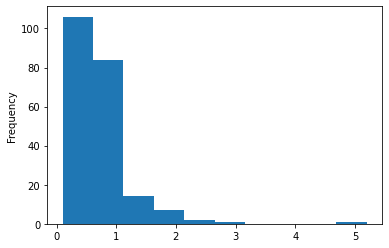

In [228]:
df['CREATININE'].plot.hist()

In [14]:
df['CREATININE'].fillna(df['CREATININE'].mode()[0], inplace=True)

In [15]:
df['UREA'].fillna(df['UREA'].mean(), inplace=True)

In [16]:
df.isna().sum()

SL.                               0
AGE                               0
GENDER                            0
MARITAL STATUS                    0
KEY COMPLAINTS -CODE              0
BODY WEIGHT                       0
BODY HEIGHT                       0
HR PULSE                          0
BP -HIGH                          0
BP-LOW                            0
RR                                0
PAST MEDICAL HISTORY CODE       173
HB                                0
UREA                              0
CREATININE                        0
MODE OF ARRIVAL                   0
STATE AT THE TIME OF ARRIVAL      0
TYPE OF ADMSN                     0
TOTAL LENGTH OF STAY              0
LENGTH OF STAY - ICU              0
LENGTH OF STAY- WARD              0
IMPLANT USED (Y/N)                0
COST OF IMPLANT                   0
TOTAL COST TO HOSPITAL            0
dtype: int64

In [246]:
df['COST OF IMPLANT'].value_counts()

0         199
20900       9
41800       6
51450       6
38000       5
39690       4
21498       3
26000       3
30870       2
56000       2
60000       1
89450       1
82320       1
41600       1
20800       1
35000       1
196848      1
102900      1
77450       1
Name: COST OF IMPLANT, dtype: int64

In [248]:
df

,SL.,AGE,GENDER,MARITAL STATUS,KEY COMPLAINTS -CODE,BODY WEIGHT,BODY HEIGHT,HR PULSE,BP -HIGH,BP-LOW,RR,PAST MEDICAL HISTORY CODE,HB,UREA,CREATININE,MODE OF ARRIVAL,STATE AT THE TIME OF ARRIVAL,TYPE OF ADMSN,TOTAL LENGTH OF STAY,LENGTH OF STAY - ICU,LENGTH OF STAY- WARD,IMPLANT USED (Y/N),COST OF IMPLANT,TOTAL COST TO HOSPITAL
0,1,58.0,M,MARRIED,other- heart,49.2,160,118,100.0,80.0,32,NaN,11.4,33.0,0.8,AMBULANCE,ALERT,EMERGENCY,25,12,13,Y,38000,660293.0
1,2,59.0,M,MARRIED,CAD-DVD,41.0,155,78,70.0,50.0,28,NaN,11.4,95.0,1.7,AMBULANCE,ALERT,EMERGENCY,41,20,21,Y,39690,809130.0
2,3,82.0,M,MARRIED,CAD-TVD,46.6,164,100,110.0,80.0,20,Diabetes2,11.8,15.0,0.8,WALKED IN,ALERT,ELECTIVE,18,9,9,N,0,362231.0
3,4,46.0,M,MARRIED,CAD-DVD,80.0,173,122,110.0,80.0,24,hypertension1,11.8,74.0,1.5,AMBULANCE,ALERT,EMERGENCY,14,13,1,Y,89450,629990.0
4,5,60.0,M,MARRIED,CAD-DVD,58.0,175,72,180.0,100.0,18,Diabetes2,10.0,48.0,1.9,AMBULANCE,ALERT,EMERGENCY,24,12,12,N,0,444876.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
243,244,51.0,M,MARRIED,other- heart,69.0,176,62,130.0,90.0,24,NaN,13.2,26.0,1.1,WALKED IN,ALERT,ELECTIVE,10,3,7,Y,35000,295155.0
244,245,58.0,M,MARRIED,CAD-TVD,57.0,159,58,100.0,70.0,24,other,10.6,15.0,0.8,WALKED IN,ALERT,ELECTIVE,11,2,9,Y,26000,200321.0
245,246,44.0,M,MARRIED,CAD-TVD,58.0,159,68,150.0,90.0,24,hypertension1,15.2,23.0,0.9,WALKED IN,ALERT,ELECTIVE,13,5,8,N,0,191188.0
246,247,60.0,M,MARRIED,other- heart,65.0,165,98,100.0,60.0,17,NaN,14.5,36.0,1.0,AMBULANCE,ALERT,EMERGENCY,9,6,3,N,0,202807.0


In [21]:
df_drop = df.drop(['SL.', 'PAST MEDICAL HISTORY CODE'], axis=1)
df1_drop = df.drop(['SL.', 'PAST MEDICAL HISTORY CODE'], axis=1)
df2_drop = df.drop(['SL.', 'PAST MEDICAL HISTORY CODE'], axis=1)

In [18]:
cat_col = df_drop.select_dtypes(exclude=np.number).columns

In [19]:
cat_col

Index(['GENDER', 'MARITAL STATUS', 'KEY COMPLAINTS -CODE', 'MODE OF ARRIVAL',
       'STATE AT THE TIME OF ARRIVAL', 'TYPE OF ADMSN', 'IMPLANT USED (Y/N)'],
      dtype='object')

#### Leave One Out Encoder

In [20]:
le = LeaveOneOutEncoder()

df_drop[cat_col] = le.fit_transform(X = df_drop[cat_col], y = df_drop['TOTAL COST TO HOSPITAL '])

In [22]:
df2_drop = pd.get_dummies(df2_drop)

df2_drop.head()

,AGE,BODY WEIGHT,BODY HEIGHT,HR PULSE,BP -HIGH,BP-LOW,RR,HB,UREA,CREATININE,TOTAL LENGTH OF STAY,LENGTH OF STAY - ICU,LENGTH OF STAY- WARD,COST OF IMPLANT,TOTAL COST TO HOSPITAL,GENDER_F,GENDER_M,MARITAL STATUS_MARRIED,MARITAL STATUS_UNMARRIED,KEY COMPLAINTS -CODE_ACHD,KEY COMPLAINTS -CODE_CAD-DVD,KEY COMPLAINTS -CODE_CAD-SVD,KEY COMPLAINTS -CODE_CAD-TVD,KEY COMPLAINTS -CODE_CAD-VSD,KEY COMPLAINTS -CODE_OS-ASD,KEY COMPLAINTS -CODE_PM-VSD,KEY COMPLAINTS -CODE_RHD,KEY COMPLAINTS -CODE_other- heart,KEY COMPLAINTS -CODE_other- respiratory,KEY COMPLAINTS -CODE_other-general,KEY COMPLAINTS -CODE_other-nervous,KEY COMPLAINTS -CODE_other-tertalogy,MODE OF ARRIVAL_AMBULANCE,MODE OF ARRIVAL_TRANSFERRED,MODE OF ARRIVAL_WALKED IN,STATE AT THE TIME OF ARRIVAL_ALERT,STATE AT THE TIME OF ARRIVAL_CONFUSED,TYPE OF ADMSN_ELECTIVE,TYPE OF ADMSN_EMERGENCY,IMPLANT USED (Y/N)_N,IMPLANT USED (Y/N)_Y
0,58.0,49.2,160,118,100.0,80.0,32,11.4,33.0,0.8,25,12,13,38000,660293.0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,1,0,1
1,59.0,41.0,155,78,70.0,50.0,28,11.4,95.0,1.7,41,20,21,39690,809130.0,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,1
2,82.0,46.6,164,100,110.0,80.0,20,11.8,15.0,0.8,18,9,9,0,362231.0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,1,0
3,46.0,80.0,173,122,110.0,80.0,24,11.8,74.0,1.5,14,13,1,89450,629990.0,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,1
4,60.0,58.0,175,72,180.0,100.0,18,10.0,48.0,1.9,24,12,12,0,444876.0,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,1,0


In [256]:
df_drop.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 248 entries, 0 to 247
Data columns (total 22 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   AGE                           248 non-null    float64
 1   GENDER                        248 non-null    float64
 2   MARITAL STATUS                248 non-null    float64
 3   KEY COMPLAINTS -CODE          248 non-null    float64
 4   BODY WEIGHT                   248 non-null    float64
 5   BODY HEIGHT                   248 non-null    int64  
 6   HR PULSE                      248 non-null    int64  
 7   BP -HIGH                      248 non-null    float64
 8   BP-LOW                        248 non-null    float64
 9   RR                            248 non-null    int64  
 10  HB                            248 non-null    float64
 11  UREA                          248 non-null    float64
 12  CREATININE                    248 non-null    float64
 13  MODE 

#### Train Test Split

In [27]:
X = df_drop.drop('TOTAL COST TO HOSPITAL ', axis=1)
y = df_drop['TOTAL COST TO HOSPITAL ']

In [23]:
X2 = df2_drop.drop('TOTAL COST TO HOSPITAL ', axis=1)
y2 = df2_drop['TOTAL COST TO HOSPITAL ']

In [259]:
X.head()

,AGE,GENDER,MARITAL STATUS,KEY COMPLAINTS -CODE,BODY WEIGHT,BODY HEIGHT,HR PULSE,BP -HIGH,BP-LOW,RR,HB,UREA,CREATININE,MODE OF ARRIVAL,STATE AT THE TIME OF ARRIVAL,TYPE OF ADMSN,TOTAL LENGTH OF STAY,LENGTH OF STAY - ICU,LENGTH OF STAY- WARD,IMPLANT USED (Y/N),COST OF IMPLANT
0,58.0,209151.000909,247149.847757,167982.207639,49.2,160,118,100.0,80.0,32,11.4,33.0,0.8,303489.073103,196234.857358,299791.870000,25,12,13,295638.274167,38000
1,59.0,208248.958485,245758.847757,237264.928636,41.0,155,78,70.0,50.0,28,11.4,95.0,1.7,298356.762759,195629.828902,294990.676452,41,20,21,292537.503333,39690
2,82.0,210957.437273,249935.473925,274872.215652,46.6,164,100,110.0,80.0,20,11.8,15.0,0.8,182877.629296,197446.491504,181243.320651,18,9,9,172071.842172,0
3,46.0,209334.655455,247433.053364,241336.292273,80.0,173,122,110.0,80.0,24,11.8,74.0,1.5,304534.004138,196358.040285,300769.386129,14,13,1,296269.586667,89450
4,60.0,210456.558485,249163.090748,245543.428636,58.0,175,72,180.0,100.0,18,10.0,48.0,1.9,310917.245517,197110.536220,306740.805484,24,12,12,171654.443182,0


In [260]:
y.head()

0    660293.0
1    809130.0
2    362231.0
3    629990.0
4    444876.0
Name: TOTAL COST TO HOSPITAL , dtype: float64

In [28]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=123)
X_train_o, X_test_o, y_train_o, y_test_o = train_test_split(X2, y2, test_size=0.3, random_state=123)

#### Modelling

In [29]:
def metrics(y_true, y_pred):
    print('MAE:', mean_absolute_error(y_true, y_pred))
    print('MAPE:', mean_absolute_percentage_error(y_true, y_pred))
    print('MSE:', mean_squared_error(y_true, y_pred))
    print('RMSE:', np.sqrt(mean_squared_error(y_true, y_pred)))
    print('R2 Score:', r2_score(y_true, y_pred))
    
def predictions(model, X_train = X_train, X_test = X_test, y_train = y_train, y_test = y_test):
    
    model.fit(X_train, y_train)
    
    train_pred = model.predict(X_train)
    
    test_pred = model.predict(X_test)
    
    actual = [y_train, y_test]
    
    pred = [train_pred, test_pred]
    
    plt.title('Actual vs Predictions')
    plt.scatter(y_test, test_pred)
    plt.show()
    
    data = ['Train', 'Test']
    
    for i in range(2):
        
        print(data[i],'\n')
        
        metrics(actual[i], pred[i])

#### Linear Regression

In [31]:
lr = LinearRegression()

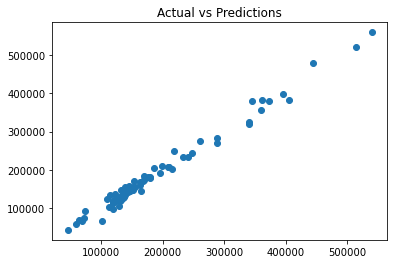

Train 

MAE: 8314.775225069112
MAPE: 0.04652899189901735
MSE: 154354449.2436792
RMSE: 12423.946604991475
R2 Score: 0.990782378235722
Test 

MAE: 9792.789954518672
MAPE: 0.05926464136607092
MSE: 171819146.59649375
RMSE: 13107.980263812336
R2 Score: 0.9839361957045366


In [295]:


predictions(lr)

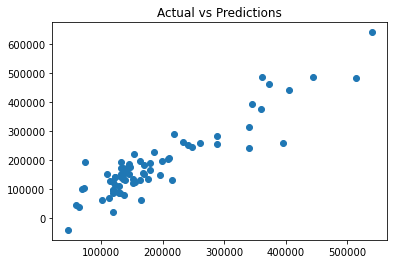

Train 

MAE: 29548.68233988377
MAPE: 0.1471393245367157
MSE: 2245226142.7670636
RMSE: 47383.81730894065
R2 Score: 0.8659212905057028
Test 

MAE: 36670.33647109405
MAPE: 0.24476859385281524
MSE: 2311233228.233481
RMSE: 48075.28708425443
R2 Score: 0.7839169906558465


In [32]:
predictions(lr,X_train_o, X_test_o, y_train_o, y_test_o)

#### Lasso

/Applications/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:530: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13331482245.590256, tolerance: 289698583.88681966
  model = cd_fast.enet_coordinate_descent(


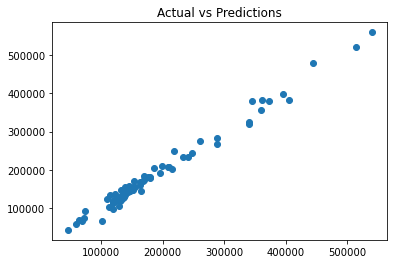

Train 

MAE: 8313.460382796542
MAPE: 0.04652304167100774
MSE: 154355633.49000445
RMSE: 12423.994264728412
R2 Score: 0.9907823075157994
Test 

MAE: 9795.51699218849
MAPE: 0.05927760103203494
MSE: 171845115.9705954
RMSE: 13108.970820418946
R2 Score: 0.9839337677624155


In [296]:
ls = Lasso()

predictions(ls)

#### Ridge

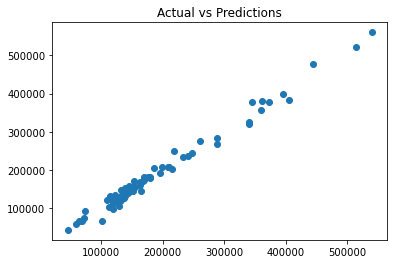

Train 

MAE: 8209.56234876961
MAPE: 0.04576521846821978
MSE: 154625945.9419606
RMSE: 12434.868151370187
R2 Score: 0.9907661652021019
Test 

MAE: 9627.965290858543
MAPE: 0.058178265785409036
MSE: 165562728.87669855
RMSE: 12867.118126321004
R2 Score: 0.984521123937695


In [297]:
ri = Ridge()

predictions(ri)

#### Elastic Net

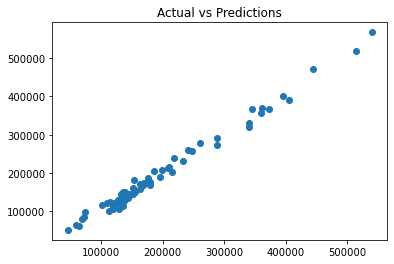

Train 

MAE: 7841.44787557624
MAPE: 0.04322921064447214
MSE: 267838751.45469427
RMSE: 16365.77989142877
R2 Score: 0.9840054088701501
Test 

MAE: 9018.560494346755
MAPE: 0.057937499832521874
MSE: 131272993.1571986
RMSE: 11457.44269709426
R2 Score: 0.9877269575997302


In [298]:
el = ElasticNet()

predictions(el)

#### LARS

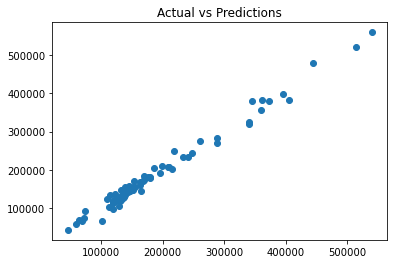

Train 

MAE: 8314.775225068941
MAPE: 0.04652899189901658
MSE: 154354449.2436719
RMSE: 12423.94660499118
R2 Score: 0.9907823782357225
Test 

MAE: 9792.789954518672
MAPE: 0.05926464136606821
MSE: 171819146.59650353
RMSE: 13107.98026381271
R2 Score: 0.9839361957045357


In [299]:
la = Lars()

predictions(la)

#### KNN 

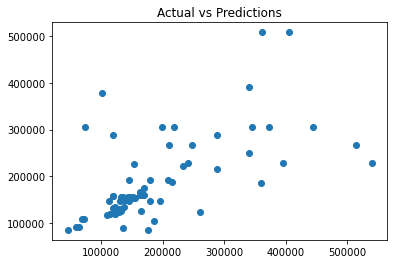

Train 

MAE: 46818.014323699426
MAPE: 0.23405704452683831
MSE: 7458001951.45464
RMSE: 86359.72412794427
R2 Score: 0.5546287039822999
Test 

MAE: 50485.24978666666
MAPE: 0.291674512075276
MSE: 7109399814.046955
RMSE: 84317.25691723466
R2 Score: 0.33532432483060415


In [300]:
knn = KNeighborsRegressor()

predictions(knn)

#### SVM

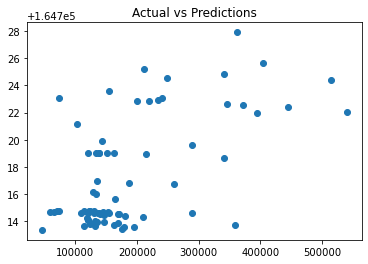

Train 

MAE: 76880.41326704365
MAPE: 0.36484033731630816
MSE: 18243336379.284214
RMSE: 135067.895442567
R2 Score: -0.0894417056761323
Test 

MAE: 70680.25625368471
MAPE: 0.3914764615867061
MSE: 11231862984.29771
RMSE: 105980.48397840855
R2 Score: -0.0500951286700162


In [301]:
svm = SVR()

predictions(svm)

#### Decision Tree

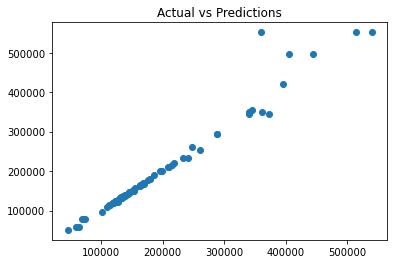

Train 

MAE: 0.0
MAPE: 0.0
MSE: 0.0
RMSE: 0.0
R2 Score: 1.0
Test 

MAE: 7873.3964
MAPE: 0.02939163198178073
MSE: 692831028.0967294
RMSE: 26321.683610603814
R2 Score: 0.9352254840881764


In [302]:
dtree = DecisionTreeRegressor()

predictions(dtree)

#### Bagging Regressor

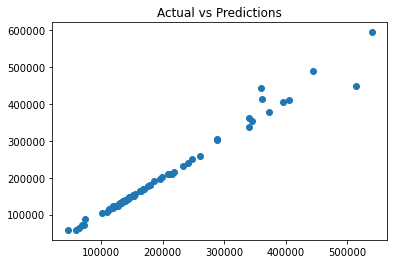

Train 

MAE: 5655.856323699424
MAPE: 0.018605456527007177
MSE: 492339020.5802603
RMSE: 22188.71381086025
R2 Score: 0.9705988723114845
Test 

MAE: 6524.924359999999
MAPE: 0.02609640451125516
MSE: 282696380.2804317
RMSE: 16813.577260072638
R2 Score: 0.9735700041711567


In [303]:
bag = BaggingRegressor()

predictions(bag)

#### Random Forest Regressor

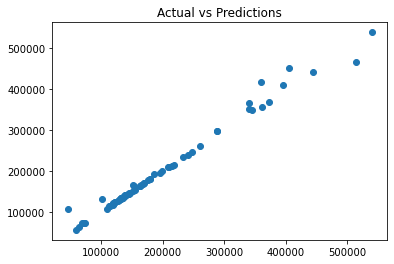

Train 

MAE: 3495.7642624277496
MAPE: 0.014222438874202433
MSE: 188969060.81487948
RMSE: 13746.601791529407
R2 Score: 0.9887152891524847
Test 

MAE: 5498.45915466665
MAPE: 0.03827761697509916
MSE: 187190591.44271165
RMSE: 13681.76126976025
R2 Score: 0.9824990806528129


In [304]:
rf = RandomForestRegressor()

predictions(rf)

#### AdaBoost

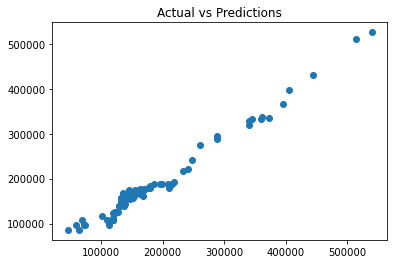

Train 

MAE: 12382.38759563345
MAPE: 0.08716222273745008
MSE: 239503272.9012638
RMSE: 15475.893282820989
R2 Score: 0.9856975254569742
Test 

MAE: 14682.73277589602
MAPE: 0.11014287482722498
MSE: 320454150.40935326
RMSE: 17901.233209177328
R2 Score: 0.9700399352469495


In [305]:
ada = AdaBoostRegressor()

predictions(ada)

#### Gradient Boost

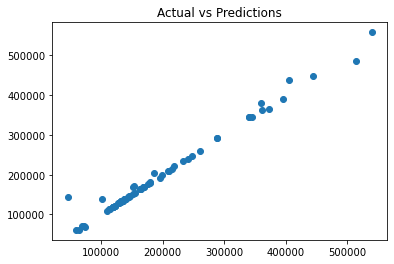

Train 

MAE: 280.8007737316312
MAPE: 0.001796986787785211
MSE: 159824.45513518387
RMSE: 399.78050869844054
R2 Score: 0.9999904557245785
Test 

MAE: 4969.597096937388
MAPE: 0.047405688818349855
MSE: 196777957.85521457
RMSE: 14027.756693613364
R2 Score: 0.9816027336460323


In [306]:
grad = GradientBoostingRegressor()

predictions(grad)

#### Light GBM

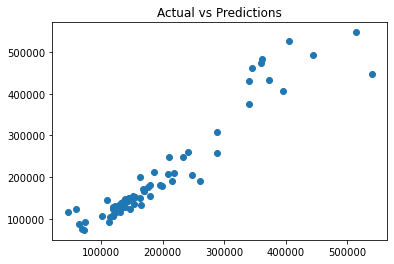

Train 

MAE: 13865.010488295955
MAPE: 0.06290667284683123
MSE: 856042382.4414172
RMSE: 29258.20196870302
R2 Score: 0.9488795111886968
Test 

MAE: 23355.53534946477
MAPE: 0.13098330908672817
MSE: 1463289563.3338606
RMSE: 38252.96803300184
R2 Score: 0.863193377230586


In [307]:
lgbm = LGBMRegressor()

predictions(lgbm)

#### XG Boost

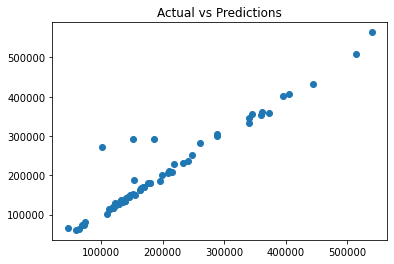

Train 

MAE: 0.5056647398844115
MAPE: 3.497820830134289e-06
MSE: 0.5309036400938215
RMSE: 0.7286313471803293
R2 Score: 0.9999999999682959
Test 

MAE: 10057.124116666666
MAPE: 0.07007988209101314
MSE: 856592064.1759896
RMSE: 29267.594096132834
R2 Score: 0.9199150528183866


In [308]:
xgb = XGBRegressor()

predictions(xgb)

#### CAT Boost

Learning rate set to 0.028561
0:	learn: 127873.4146180	total: 4.28ms	remaining: 4.28s
1:	learn: 126071.3269749	total: 7.4ms	remaining: 3.69s
2:	learn: 124170.2805808	total: 9.91ms	remaining: 3.29s
3:	learn: 122367.2333990	total: 12.3ms	remaining: 3.06s
4:	learn: 120816.9006177	total: 14.8ms	remaining: 2.95s
5:	learn: 119236.0735067	total: 17.2ms	remaining: 2.86s
6:	learn: 117638.3988620	total: 19.7ms	remaining: 2.79s
7:	learn: 115983.9729584	total: 22.1ms	remaining: 2.74s
8:	learn: 114244.5924262	total: 25.2ms	remaining: 2.77s
9:	learn: 112553.0771004	total: 27.7ms	remaining: 2.74s
10:	learn: 111165.1233781	total: 30ms	remaining: 2.7s
11:	learn: 109442.2059367	total: 32.5ms	remaining: 2.68s
12:	learn: 108150.3661943	total: 38.6ms	remaining: 2.93s
13:	learn: 107071.7571865	total: 42ms	remaining: 2.96s
14:	learn: 105814.0932572	total: 44.8ms	remaining: 2.94s
15:	learn: 104427.1182626	total: 49.4ms	remaining: 3.04s
16:	learn: 102920.1774901	total: 53.4ms	remaining: 3.09s
17:	learn: 101406

153:	learn: 24872.5061285	total: 346ms	remaining: 1.9s
154:	learn: 24613.6703038	total: 348ms	remaining: 1.9s
155:	learn: 24455.1686263	total: 351ms	remaining: 1.9s
156:	learn: 24284.8293628	total: 353ms	remaining: 1.9s
157:	learn: 24087.2610692	total: 355ms	remaining: 1.89s
158:	learn: 23962.6921366	total: 358ms	remaining: 1.89s
159:	learn: 23789.3193998	total: 360ms	remaining: 1.89s
160:	learn: 23585.2463262	total: 362ms	remaining: 1.89s
161:	learn: 23433.3390532	total: 365ms	remaining: 1.89s
162:	learn: 23263.2751939	total: 367ms	remaining: 1.89s
163:	learn: 23050.0478451	total: 370ms	remaining: 1.89s
164:	learn: 22788.6787598	total: 372ms	remaining: 1.88s
165:	learn: 22580.3291769	total: 375ms	remaining: 1.88s
166:	learn: 22358.1264738	total: 378ms	remaining: 1.88s
167:	learn: 22188.7239042	total: 380ms	remaining: 1.88s
168:	learn: 21995.1028401	total: 382ms	remaining: 1.88s
169:	learn: 21906.2831811	total: 385ms	remaining: 1.88s
170:	learn: 21715.2829379	total: 388ms	remaining: 1.

339:	learn: 7167.3476883	total: 864ms	remaining: 1.68s
340:	learn: 7122.6645655	total: 866ms	remaining: 1.67s
341:	learn: 7103.5092466	total: 868ms	remaining: 1.67s
342:	learn: 7055.3130619	total: 871ms	remaining: 1.67s
343:	learn: 7006.8662143	total: 873ms	remaining: 1.66s
344:	learn: 6952.8429331	total: 875ms	remaining: 1.66s
345:	learn: 6936.3165484	total: 881ms	remaining: 1.66s
346:	learn: 6918.6695354	total: 886ms	remaining: 1.67s
347:	learn: 6869.4716389	total: 890ms	remaining: 1.67s
348:	learn: 6823.0529368	total: 894ms	remaining: 1.67s
349:	learn: 6767.1338649	total: 910ms	remaining: 1.69s
350:	learn: 6745.1177902	total: 912ms	remaining: 1.69s
351:	learn: 6728.7698772	total: 916ms	remaining: 1.69s
352:	learn: 6674.6851690	total: 920ms	remaining: 1.69s
353:	learn: 6658.3358185	total: 923ms	remaining: 1.69s
354:	learn: 6642.5937836	total: 927ms	remaining: 1.68s
355:	learn: 6599.0310098	total: 938ms	remaining: 1.7s
356:	learn: 6555.8059106	total: 942ms	remaining: 1.7s
357:	learn: 

509:	learn: 3457.6527641	total: 1.77s	remaining: 1.7s
510:	learn: 3450.3581799	total: 1.78s	remaining: 1.7s
511:	learn: 3441.2589539	total: 1.78s	remaining: 1.7s
512:	learn: 3419.3062791	total: 1.79s	remaining: 1.7s
513:	learn: 3414.2105197	total: 1.79s	remaining: 1.69s
514:	learn: 3393.3943705	total: 1.79s	remaining: 1.69s
515:	learn: 3389.1876109	total: 1.8s	remaining: 1.69s
516:	learn: 3364.7529276	total: 1.8s	remaining: 1.68s
517:	learn: 3344.9412860	total: 1.81s	remaining: 1.68s
518:	learn: 3340.9693996	total: 1.81s	remaining: 1.68s
519:	learn: 3322.0929864	total: 1.82s	remaining: 1.68s
520:	learn: 3317.1458905	total: 1.82s	remaining: 1.68s
521:	learn: 3304.0880100	total: 1.82s	remaining: 1.67s
522:	learn: 3284.0497397	total: 1.83s	remaining: 1.67s
523:	learn: 3266.7813408	total: 1.83s	remaining: 1.66s
524:	learn: 3261.8969171	total: 1.84s	remaining: 1.66s
525:	learn: 3258.6331949	total: 1.84s	remaining: 1.66s
526:	learn: 3255.3328625	total: 1.84s	remaining: 1.65s
527:	learn: 3242

673:	learn: 1843.5721508	total: 2.66s	remaining: 1.29s
674:	learn: 1841.8249700	total: 2.67s	remaining: 1.28s
675:	learn: 1829.8963012	total: 2.67s	remaining: 1.28s
676:	learn: 1827.6137674	total: 2.68s	remaining: 1.28s
677:	learn: 1819.3434457	total: 2.68s	remaining: 1.27s
678:	learn: 1807.5252796	total: 2.69s	remaining: 1.27s
679:	learn: 1802.3448566	total: 2.69s	remaining: 1.27s
680:	learn: 1794.1683972	total: 2.7s	remaining: 1.26s
681:	learn: 1788.4335021	total: 2.7s	remaining: 1.26s
682:	learn: 1782.3975885	total: 2.71s	remaining: 1.26s
683:	learn: 1779.5135476	total: 2.71s	remaining: 1.25s
684:	learn: 1770.7987051	total: 2.72s	remaining: 1.25s
685:	learn: 1764.4356832	total: 2.72s	remaining: 1.25s
686:	learn: 1753.2293866	total: 2.73s	remaining: 1.24s
687:	learn: 1743.7007947	total: 2.74s	remaining: 1.24s
688:	learn: 1738.5104563	total: 2.74s	remaining: 1.24s
689:	learn: 1736.0553806	total: 2.75s	remaining: 1.23s
690:	learn: 1730.5776032	total: 2.75s	remaining: 1.23s
691:	learn: 

848:	learn: 970.2300841	total: 3.55s	remaining: 632ms
849:	learn: 968.1914052	total: 3.56s	remaining: 628ms
850:	learn: 966.3191204	total: 3.56s	remaining: 623ms
851:	learn: 962.1167457	total: 3.56s	remaining: 619ms
852:	learn: 960.0653018	total: 3.56s	remaining: 614ms
853:	learn: 955.1041289	total: 3.57s	remaining: 610ms
854:	learn: 951.1061001	total: 3.57s	remaining: 605ms
855:	learn: 948.0002171	total: 3.57s	remaining: 601ms
856:	learn: 944.9756292	total: 3.58s	remaining: 597ms
857:	learn: 942.8682238	total: 3.58s	remaining: 592ms
858:	learn: 941.7981387	total: 3.58s	remaining: 588ms
859:	learn: 941.2695282	total: 3.58s	remaining: 584ms
860:	learn: 940.2594030	total: 3.59s	remaining: 579ms
861:	learn: 936.7377824	total: 3.6s	remaining: 576ms
862:	learn: 933.7217480	total: 3.6s	remaining: 572ms
863:	learn: 927.6200336	total: 3.6s	remaining: 567ms
864:	learn: 922.6738651	total: 3.61s	remaining: 563ms
865:	learn: 919.9818300	total: 3.61s	remaining: 559ms
866:	learn: 915.5237435	total: 

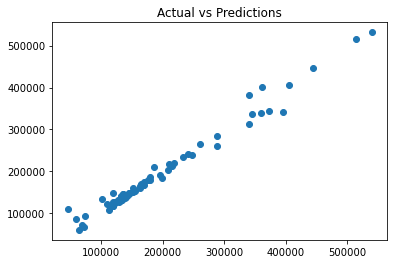

Train 

MAE: 501.5075045169856
MAPE: 0.0031977453222054994
MSE: 367172.39976054715
RMSE: 605.9475222827033
R2 Score: 0.9999780734775068
Test 

MAE: 8973.41543901504
MAPE: 0.06746459089489186
MSE: 244144179.5265
RMSE: 15625.11374443399
R2 Score: 0.9771743464132059


In [309]:
cat = CatBoostRegressor()

predictions(cat)

#### Voting Regressor

In [289]:
esti = [('el', el), ('cat', cat)]

vote = VotingRegressor(estimators=esti, n_jobs=3, verbose=True)

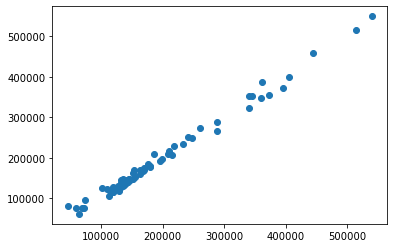

Train 

MAE: 3978.6038692540146
MAPE: 0.021980911833300636
MSE: 67816290.41454624
RMSE: 8235.064687939388
R2 Score: 0.9959501982770133
Test 

MAE: 7303.070854615015
MAPE: 0.05343082818015508
MSE: 104532739.34593889
RMSE: 10224.125358481228
R2 Score: 0.9902269712044064


In [292]:
predictions(vote)

#### Stacking Regressor

In [313]:
re1 = ElasticNet()

re2 = CatBoostRegressor()

In [314]:
stack = StackingCVRegressor(regressors=[re1, re2], meta_regressor=lr)

Learning rate set to 0.027435
0:	learn: 121498.1918113	total: 2.47ms	remaining: 2.47s
1:	learn: 120087.8956426	total: 4.59ms	remaining: 2.29s
2:	learn: 118557.9874377	total: 7.09ms	remaining: 2.36s
3:	learn: 117479.5818387	total: 9.3ms	remaining: 2.31s
4:	learn: 116121.8338149	total: 11.6ms	remaining: 2.31s
5:	learn: 114770.4620740	total: 13.7ms	remaining: 2.27s
6:	learn: 113331.9807565	total: 16.2ms	remaining: 2.3s
7:	learn: 111998.8371531	total: 18.4ms	remaining: 2.28s
8:	learn: 110289.1812198	total: 20.5ms	remaining: 2.26s
9:	learn: 108776.7277152	total: 22.8ms	remaining: 2.26s
10:	learn: 107605.5580179	total: 24.7ms	remaining: 2.22s
11:	learn: 106185.7192453	total: 26.8ms	remaining: 2.21s
12:	learn: 104822.0091232	total: 29ms	remaining: 2.2s
13:	learn: 103838.6138625	total: 32.3ms	remaining: 2.28s
14:	learn: 102796.2849333	total: 34.9ms	remaining: 2.29s
15:	learn: 101508.0204022	total: 39.2ms	remaining: 2.41s
16:	learn: 100102.5124653	total: 42.1ms	remaining: 2.44s
17:	learn: 98865

188:	learn: 21541.6779645	total: 526ms	remaining: 2.26s
189:	learn: 21395.0856960	total: 528ms	remaining: 2.25s
190:	learn: 21262.7036527	total: 531ms	remaining: 2.25s
191:	learn: 21052.2195680	total: 535ms	remaining: 2.25s
192:	learn: 20812.0047604	total: 538ms	remaining: 2.25s
193:	learn: 20719.1526076	total: 541ms	remaining: 2.25s
194:	learn: 20617.0123908	total: 544ms	remaining: 2.24s
195:	learn: 20481.3293766	total: 546ms	remaining: 2.24s
196:	learn: 20315.4775326	total: 551ms	remaining: 2.24s
197:	learn: 20202.8214062	total: 553ms	remaining: 2.24s
198:	learn: 19999.3758777	total: 555ms	remaining: 2.23s
199:	learn: 19805.6111157	total: 560ms	remaining: 2.24s
200:	learn: 19706.1539143	total: 567ms	remaining: 2.25s
201:	learn: 19524.1579925	total: 570ms	remaining: 2.25s
202:	learn: 19406.6632652	total: 572ms	remaining: 2.25s
203:	learn: 19227.7326688	total: 574ms	remaining: 2.24s
204:	learn: 19086.8865899	total: 576ms	remaining: 2.23s
205:	learn: 18986.0691473	total: 578ms	remaining

384:	learn: 6457.8994105	total: 1.05s	remaining: 1.69s
385:	learn: 6436.0822860	total: 1.06s	remaining: 1.68s
386:	learn: 6414.4397562	total: 1.06s	remaining: 1.68s
387:	learn: 6393.0501444	total: 1.07s	remaining: 1.68s
388:	learn: 6371.8205376	total: 1.07s	remaining: 1.68s
389:	learn: 6319.1927516	total: 1.08s	remaining: 1.69s
390:	learn: 6298.3434283	total: 1.08s	remaining: 1.68s
391:	learn: 6277.7292788	total: 1.08s	remaining: 1.68s
392:	learn: 6257.2285336	total: 1.09s	remaining: 1.68s
393:	learn: 6237.0300656	total: 1.09s	remaining: 1.68s
394:	learn: 6176.6364194	total: 1.1s	remaining: 1.68s
395:	learn: 6156.6913510	total: 1.1s	remaining: 1.68s
396:	learn: 6104.4192574	total: 1.11s	remaining: 1.68s
397:	learn: 6085.0124793	total: 1.11s	remaining: 1.68s
398:	learn: 6035.3942506	total: 1.11s	remaining: 1.68s
399:	learn: 6016.1778711	total: 1.12s	remaining: 1.68s
400:	learn: 5997.3661946	total: 1.12s	remaining: 1.68s
401:	learn: 5941.8988580	total: 1.13s	remaining: 1.69s
402:	learn: 

546:	learn: 3304.6516523	total: 1.95s	remaining: 1.61s
547:	learn: 3292.1097728	total: 1.96s	remaining: 1.61s
548:	learn: 3287.6341996	total: 1.96s	remaining: 1.61s
549:	learn: 3272.5035283	total: 1.97s	remaining: 1.61s
550:	learn: 3267.6774025	total: 1.97s	remaining: 1.6s
551:	learn: 3262.8151129	total: 1.98s	remaining: 1.6s
552:	learn: 3258.0428151	total: 1.98s	remaining: 1.6s
553:	learn: 3253.2965925	total: 1.99s	remaining: 1.6s
554:	learn: 3248.8431213	total: 1.99s	remaining: 1.6s
555:	learn: 3240.0785271	total: 1.99s	remaining: 1.59s
556:	learn: 3229.9269648	total: 2s	remaining: 1.59s
557:	learn: 3215.4937815	total: 2s	remaining: 1.58s
558:	learn: 3209.9487548	total: 2.01s	remaining: 1.58s
559:	learn: 3193.2483702	total: 2.01s	remaining: 1.58s
560:	learn: 3188.9744567	total: 2.02s	remaining: 1.58s
561:	learn: 3178.2610581	total: 2.03s	remaining: 1.58s
562:	learn: 3166.6818943	total: 2.03s	remaining: 1.58s
563:	learn: 3149.8729286	total: 2.04s	remaining: 1.58s
564:	learn: 3136.6399

712:	learn: 1884.0722161	total: 2.67s	remaining: 1.07s
713:	learn: 1868.6976939	total: 2.67s	remaining: 1.07s
714:	learn: 1858.1002235	total: 2.68s	remaining: 1.07s
715:	learn: 1848.9000155	total: 2.68s	remaining: 1.06s
716:	learn: 1839.5094503	total: 2.68s	remaining: 1.06s
717:	learn: 1830.5002751	total: 2.69s	remaining: 1.06s
718:	learn: 1822.6706114	total: 2.69s	remaining: 1.05s
719:	learn: 1820.2308411	total: 2.7s	remaining: 1.05s
720:	learn: 1816.5239809	total: 2.7s	remaining: 1.04s
721:	learn: 1810.7616108	total: 2.71s	remaining: 1.04s
722:	learn: 1806.5554643	total: 2.71s	remaining: 1.04s
723:	learn: 1793.6648801	total: 2.72s	remaining: 1.03s
724:	learn: 1787.4632833	total: 2.72s	remaining: 1.03s
725:	learn: 1781.0046170	total: 2.73s	remaining: 1.03s
726:	learn: 1776.4293467	total: 2.73s	remaining: 1.03s
727:	learn: 1774.4205893	total: 2.74s	remaining: 1.02s
728:	learn: 1766.7841510	total: 2.75s	remaining: 1.02s
729:	learn: 1755.8252676	total: 2.75s	remaining: 1.02s
730:	learn: 

905:	learn: 942.0148191	total: 3.55s	remaining: 368ms
906:	learn: 937.2229440	total: 3.55s	remaining: 364ms
907:	learn: 936.7138577	total: 3.56s	remaining: 361ms
908:	learn: 935.1590338	total: 3.56s	remaining: 357ms
909:	learn: 931.7416539	total: 3.57s	remaining: 353ms
910:	learn: 929.6482323	total: 3.57s	remaining: 349ms
911:	learn: 925.8635713	total: 3.58s	remaining: 345ms
912:	learn: 919.7545766	total: 3.58s	remaining: 341ms
913:	learn: 915.5264375	total: 3.59s	remaining: 338ms
914:	learn: 911.3185514	total: 3.6s	remaining: 334ms
915:	learn: 908.2985767	total: 3.6s	remaining: 330ms
916:	learn: 905.8782092	total: 3.6s	remaining: 326ms
917:	learn: 902.3303765	total: 3.61s	remaining: 322ms
918:	learn: 897.9334365	total: 3.61s	remaining: 318ms
919:	learn: 893.5440587	total: 3.61s	remaining: 314ms
920:	learn: 892.1275949	total: 3.61s	remaining: 310ms
921:	learn: 890.2107648	total: 3.62s	remaining: 306ms
922:	learn: 887.8977207	total: 3.62s	remaining: 302ms
923:	learn: 882.6115101	total: 

86:	learn: 43103.2478044	total: 333ms	remaining: 3.49s
87:	learn: 42718.0294606	total: 339ms	remaining: 3.51s
88:	learn: 42442.1875961	total: 344ms	remaining: 3.52s
89:	learn: 42078.4474978	total: 348ms	remaining: 3.52s
90:	learn: 41716.0983981	total: 352ms	remaining: 3.52s
91:	learn: 41346.4665184	total: 356ms	remaining: 3.52s
92:	learn: 40904.4368807	total: 361ms	remaining: 3.52s
93:	learn: 40556.5718242	total: 365ms	remaining: 3.52s
94:	learn: 40177.8637824	total: 369ms	remaining: 3.52s
95:	learn: 39719.3808713	total: 377ms	remaining: 3.55s
96:	learn: 39357.8569852	total: 380ms	remaining: 3.54s
97:	learn: 39043.6460452	total: 387ms	remaining: 3.57s
98:	learn: 38700.0906541	total: 392ms	remaining: 3.57s
99:	learn: 38298.4747391	total: 397ms	remaining: 3.57s
100:	learn: 37841.9938399	total: 406ms	remaining: 3.61s
101:	learn: 37421.9713007	total: 407ms	remaining: 3.59s
102:	learn: 37096.3349692	total: 409ms	remaining: 3.56s
103:	learn: 36779.2722987	total: 420ms	remaining: 3.62s
104:	l

257:	learn: 11177.4486466	total: 1.03s	remaining: 2.97s
258:	learn: 11060.2822402	total: 1.04s	remaining: 2.97s
259:	learn: 10970.6000682	total: 1.04s	remaining: 2.98s
260:	learn: 10922.9397010	total: 1.05s	remaining: 2.97s
261:	learn: 10825.7114632	total: 1.05s	remaining: 2.97s
262:	learn: 10768.2514932	total: 1.06s	remaining: 2.96s
263:	learn: 10724.8048016	total: 1.07s	remaining: 2.99s
264:	learn: 10674.4780173	total: 1.08s	remaining: 3s
265:	learn: 10581.7059938	total: 1.09s	remaining: 3s
266:	learn: 10532.6988805	total: 1.1s	remaining: 3.03s
267:	learn: 10476.2319771	total: 1.1s	remaining: 3.02s
268:	learn: 10402.2729423	total: 1.11s	remaining: 3.02s
269:	learn: 10306.5932237	total: 1.11s	remaining: 3.01s
270:	learn: 10253.0912441	total: 1.11s	remaining: 3s
271:	learn: 10198.3175190	total: 1.12s	remaining: 2.99s
272:	learn: 10141.8863659	total: 1.12s	remaining: 2.99s
273:	learn: 10093.4252809	total: 1.12s	remaining: 2.98s
274:	learn: 10002.0071690	total: 1.13s	remaining: 2.97s
275

424:	learn: 4715.5699833	total: 1.72s	remaining: 2.33s
425:	learn: 4682.9607418	total: 1.73s	remaining: 2.32s
426:	learn: 4673.8241131	total: 1.74s	remaining: 2.33s
427:	learn: 4639.1971325	total: 1.74s	remaining: 2.32s
428:	learn: 4603.5514306	total: 1.74s	remaining: 2.31s
429:	learn: 4593.5152496	total: 1.74s	remaining: 2.31s
430:	learn: 4583.5321249	total: 1.75s	remaining: 2.31s
431:	learn: 4553.8406953	total: 1.75s	remaining: 2.3s
432:	learn: 4544.2214312	total: 1.76s	remaining: 2.3s
433:	learn: 4534.7177212	total: 1.76s	remaining: 2.3s
434:	learn: 4525.8729162	total: 1.76s	remaining: 2.29s
435:	learn: 4516.1981056	total: 1.77s	remaining: 2.29s
436:	learn: 4506.9834348	total: 1.77s	remaining: 2.29s
437:	learn: 4497.1003179	total: 1.78s	remaining: 2.28s
438:	learn: 4467.5570665	total: 1.78s	remaining: 2.27s
439:	learn: 4440.5853282	total: 1.78s	remaining: 2.27s
440:	learn: 4431.1021109	total: 1.79s	remaining: 2.26s
441:	learn: 4399.5290621	total: 1.79s	remaining: 2.26s
442:	learn: 4

603:	learn: 2538.3164593	total: 2.41s	remaining: 1.58s
604:	learn: 2528.7088710	total: 2.42s	remaining: 1.58s
605:	learn: 2526.3611576	total: 2.42s	remaining: 1.57s
606:	learn: 2518.9745050	total: 2.43s	remaining: 1.57s
607:	learn: 2507.2056595	total: 2.43s	remaining: 1.57s
608:	learn: 2493.5907130	total: 2.44s	remaining: 1.56s
609:	learn: 2491.3478135	total: 2.44s	remaining: 1.56s
610:	learn: 2487.1740158	total: 2.45s	remaining: 1.56s
611:	learn: 2475.4407523	total: 2.45s	remaining: 1.55s
612:	learn: 2472.7946220	total: 2.46s	remaining: 1.55s
613:	learn: 2461.5515530	total: 2.46s	remaining: 1.55s
614:	learn: 2450.8811823	total: 2.47s	remaining: 1.54s
615:	learn: 2448.7272704	total: 2.47s	remaining: 1.54s
616:	learn: 2437.9201675	total: 2.48s	remaining: 1.54s
617:	learn: 2428.3497295	total: 2.48s	remaining: 1.53s
618:	learn: 2414.0040776	total: 2.48s	remaining: 1.53s
619:	learn: 2403.7169656	total: 2.49s	remaining: 1.52s
620:	learn: 2396.5399513	total: 2.49s	remaining: 1.52s
621:	learn

768:	learn: 1414.6597899	total: 3.12s	remaining: 936ms
769:	learn: 1406.5554550	total: 3.12s	remaining: 932ms
770:	learn: 1403.6016394	total: 3.12s	remaining: 928ms
771:	learn: 1394.2953352	total: 3.13s	remaining: 923ms
772:	learn: 1386.8916726	total: 3.13s	remaining: 919ms
773:	learn: 1378.8082920	total: 3.13s	remaining: 914ms
774:	learn: 1374.0765010	total: 3.13s	remaining: 910ms
775:	learn: 1369.0808822	total: 3.13s	remaining: 905ms
776:	learn: 1364.7417665	total: 3.14s	remaining: 901ms
777:	learn: 1358.7697214	total: 3.14s	remaining: 896ms
778:	learn: 1350.8879961	total: 3.14s	remaining: 891ms
779:	learn: 1344.7777024	total: 3.14s	remaining: 887ms
780:	learn: 1343.7431377	total: 3.15s	remaining: 882ms
781:	learn: 1338.6225047	total: 3.15s	remaining: 878ms
782:	learn: 1332.3369586	total: 3.15s	remaining: 874ms
783:	learn: 1327.1848328	total: 3.16s	remaining: 870ms
784:	learn: 1322.3284333	total: 3.16s	remaining: 866ms
785:	learn: 1321.2061052	total: 3.17s	remaining: 862ms
786:	learn

952:	learn: 744.3745801	total: 3.8s	remaining: 187ms
953:	learn: 741.5684959	total: 3.81s	remaining: 184ms
954:	learn: 738.9698553	total: 3.81s	remaining: 180ms
955:	learn: 737.9501525	total: 3.81s	remaining: 176ms
956:	learn: 735.0619517	total: 3.82s	remaining: 172ms
957:	learn: 734.5711556	total: 3.82s	remaining: 167ms
958:	learn: 732.0420053	total: 3.83s	remaining: 164ms
959:	learn: 729.4192649	total: 3.83s	remaining: 160ms
960:	learn: 728.9580425	total: 3.84s	remaining: 156ms
961:	learn: 726.4814990	total: 3.85s	remaining: 152ms
962:	learn: 722.3707078	total: 3.85s	remaining: 148ms
963:	learn: 720.1037983	total: 3.86s	remaining: 144ms
964:	learn: 719.6295193	total: 3.86s	remaining: 140ms
965:	learn: 717.6170145	total: 3.87s	remaining: 136ms
966:	learn: 715.8601401	total: 3.88s	remaining: 132ms
967:	learn: 715.3519211	total: 3.88s	remaining: 128ms
968:	learn: 712.2258970	total: 3.88s	remaining: 124ms
969:	learn: 707.8756852	total: 3.88s	remaining: 120ms
970:	learn: 705.1360166	total

106:	learn: 42638.3844840	total: 413ms	remaining: 3.45s
107:	learn: 42277.6686028	total: 416ms	remaining: 3.44s
108:	learn: 41911.0173659	total: 418ms	remaining: 3.42s
109:	learn: 41548.0709004	total: 420ms	remaining: 3.4s
110:	learn: 41226.3917532	total: 423ms	remaining: 3.39s
111:	learn: 40988.6107601	total: 431ms	remaining: 3.42s
112:	learn: 40545.2731665	total: 437ms	remaining: 3.43s
113:	learn: 40142.0100534	total: 442ms	remaining: 3.44s
114:	learn: 39759.7497732	total: 445ms	remaining: 3.42s
115:	learn: 39419.4293285	total: 448ms	remaining: 3.41s
116:	learn: 39092.8855686	total: 452ms	remaining: 3.41s
117:	learn: 38839.0571122	total: 458ms	remaining: 3.42s
118:	learn: 38513.1201743	total: 460ms	remaining: 3.4s
119:	learn: 38235.2677493	total: 462ms	remaining: 3.39s
120:	learn: 37953.9293664	total: 467ms	remaining: 3.39s
121:	learn: 37543.1240583	total: 469ms	remaining: 3.38s
122:	learn: 37300.4470643	total: 472ms	remaining: 3.37s
123:	learn: 36995.8868472	total: 476ms	remaining: 

279:	learn: 9998.1460263	total: 1.14s	remaining: 2.94s
280:	learn: 9950.0058242	total: 1.15s	remaining: 2.93s
281:	learn: 9898.7023914	total: 1.15s	remaining: 2.92s
282:	learn: 9842.8720062	total: 1.15s	remaining: 2.92s
283:	learn: 9760.9368378	total: 1.16s	remaining: 2.91s
284:	learn: 9677.1677544	total: 1.16s	remaining: 2.9s
285:	learn: 9600.7945265	total: 1.16s	remaining: 2.9s
286:	learn: 9519.6157182	total: 1.16s	remaining: 2.89s
287:	learn: 9461.5835193	total: 1.17s	remaining: 2.88s
288:	learn: 9398.6067685	total: 1.17s	remaining: 2.88s
289:	learn: 9331.1915623	total: 1.17s	remaining: 2.87s
290:	learn: 9261.3671926	total: 1.17s	remaining: 2.86s
291:	learn: 9186.6500276	total: 1.18s	remaining: 2.85s
292:	learn: 9137.1950947	total: 1.18s	remaining: 2.85s
293:	learn: 9085.9243671	total: 1.18s	remaining: 2.84s
294:	learn: 9036.2893803	total: 1.19s	remaining: 2.83s
295:	learn: 8984.5050624	total: 1.19s	remaining: 2.83s
296:	learn: 8937.7732629	total: 1.19s	remaining: 2.82s
297:	learn: 

452:	learn: 4375.6264287	total: 1.79s	remaining: 2.17s
453:	learn: 4343.6875886	total: 1.8s	remaining: 2.16s
454:	learn: 4332.9572299	total: 1.8s	remaining: 2.16s
455:	learn: 4325.2033421	total: 1.81s	remaining: 2.16s
456:	learn: 4312.9977747	total: 1.81s	remaining: 2.15s
457:	learn: 4303.1424046	total: 1.81s	remaining: 2.15s
458:	learn: 4280.1695181	total: 1.82s	remaining: 2.15s
459:	learn: 4272.6554601	total: 1.82s	remaining: 2.14s
460:	learn: 4239.3357063	total: 1.83s	remaining: 2.14s
461:	learn: 4209.7301098	total: 1.83s	remaining: 2.14s
462:	learn: 4195.1439489	total: 1.84s	remaining: 2.13s
463:	learn: 4159.1690973	total: 1.84s	remaining: 2.13s
464:	learn: 4151.6516357	total: 1.84s	remaining: 2.12s
465:	learn: 4140.4606853	total: 1.85s	remaining: 2.12s
466:	learn: 4130.5219929	total: 1.85s	remaining: 2.12s
467:	learn: 4122.1052605	total: 1.86s	remaining: 2.12s
468:	learn: 4094.2403207	total: 1.86s	remaining: 2.11s
469:	learn: 4085.0541109	total: 1.87s	remaining: 2.11s
470:	learn: 

635:	learn: 2115.1450267	total: 2.48s	remaining: 1.42s
636:	learn: 2112.2325185	total: 2.48s	remaining: 1.41s
637:	learn: 2099.6697337	total: 2.48s	remaining: 1.41s
638:	learn: 2090.7436742	total: 2.5s	remaining: 1.41s
639:	learn: 2077.1952210	total: 2.5s	remaining: 1.41s
640:	learn: 2068.6219323	total: 2.52s	remaining: 1.41s
641:	learn: 2056.5998012	total: 2.53s	remaining: 1.41s
642:	learn: 2044.4269377	total: 2.53s	remaining: 1.4s
643:	learn: 2034.4563195	total: 2.53s	remaining: 1.4s
644:	learn: 2022.7211504	total: 2.54s	remaining: 1.4s
645:	learn: 2011.3954786	total: 2.54s	remaining: 1.39s
646:	learn: 2002.2234405	total: 2.55s	remaining: 1.39s
647:	learn: 1990.7836687	total: 2.56s	remaining: 1.39s
648:	learn: 1981.6825845	total: 2.56s	remaining: 1.38s
649:	learn: 1974.2768054	total: 2.56s	remaining: 1.38s
650:	learn: 1972.1796379	total: 2.56s	remaining: 1.37s
651:	learn: 1961.5222992	total: 2.57s	remaining: 1.37s
652:	learn: 1959.7458631	total: 2.57s	remaining: 1.37s
653:	learn: 195

801:	learn: 1079.8381037	total: 3.16s	remaining: 781ms
802:	learn: 1078.7046286	total: 3.17s	remaining: 778ms
803:	learn: 1074.6857114	total: 3.17s	remaining: 773ms
804:	learn: 1071.2223995	total: 3.17s	remaining: 769ms
805:	learn: 1063.6468659	total: 3.18s	remaining: 765ms
806:	learn: 1058.1245607	total: 3.18s	remaining: 761ms
807:	learn: 1053.8884128	total: 3.19s	remaining: 757ms
808:	learn: 1051.3951661	total: 3.19s	remaining: 753ms
809:	learn: 1046.4316762	total: 3.19s	remaining: 749ms
810:	learn: 1041.9679970	total: 3.2s	remaining: 745ms
811:	learn: 1038.8643120	total: 3.2s	remaining: 742ms
812:	learn: 1035.4113223	total: 3.21s	remaining: 737ms
813:	learn: 1031.8632499	total: 3.21s	remaining: 733ms
814:	learn: 1027.0498977	total: 3.21s	remaining: 729ms
815:	learn: 1023.9057811	total: 3.22s	remaining: 726ms
816:	learn: 1019.8299038	total: 3.23s	remaining: 723ms
817:	learn: 1014.1658063	total: 3.23s	remaining: 718ms
818:	learn: 1012.7905315	total: 3.23s	remaining: 715ms
819:	learn: 

955:	learn: 611.8930211	total: 3.86s	remaining: 178ms
956:	learn: 609.5591510	total: 3.86s	remaining: 174ms
957:	learn: 607.6901138	total: 3.87s	remaining: 170ms
958:	learn: 605.2265037	total: 3.87s	remaining: 166ms
959:	learn: 601.4044533	total: 3.88s	remaining: 162ms
960:	learn: 599.5127775	total: 3.88s	remaining: 157ms
961:	learn: 597.2243086	total: 3.9s	remaining: 154ms
962:	learn: 594.8218607	total: 3.9s	remaining: 150ms
963:	learn: 592.1698507	total: 3.91s	remaining: 146ms
964:	learn: 590.4164879	total: 3.91s	remaining: 142ms
965:	learn: 588.1151076	total: 3.92s	remaining: 138ms
966:	learn: 585.8573088	total: 3.93s	remaining: 134ms
967:	learn: 584.1332510	total: 3.93s	remaining: 130ms
968:	learn: 582.0445843	total: 3.93s	remaining: 126ms
969:	learn: 581.1268122	total: 3.94s	remaining: 122ms
970:	learn: 577.6935821	total: 3.95s	remaining: 118ms
971:	learn: 576.0277609	total: 3.95s	remaining: 114ms
972:	learn: 573.5876745	total: 3.96s	remaining: 110ms
973:	learn: 571.4120413	total:

142:	learn: 30402.1317089	total: 581ms	remaining: 3.48s
143:	learn: 30238.4664063	total: 586ms	remaining: 3.48s
144:	learn: 29933.4761885	total: 588ms	remaining: 3.47s
145:	learn: 29618.7956751	total: 590ms	remaining: 3.45s
146:	learn: 29337.9532842	total: 598ms	remaining: 3.47s
147:	learn: 29070.5523903	total: 600ms	remaining: 3.46s
148:	learn: 28796.9390737	total: 602ms	remaining: 3.44s
149:	learn: 28604.7635046	total: 606ms	remaining: 3.44s
150:	learn: 28217.2612981	total: 612ms	remaining: 3.44s
151:	learn: 27963.7057706	total: 616ms	remaining: 3.44s
152:	learn: 27735.5934187	total: 618ms	remaining: 3.42s
153:	learn: 27493.3002515	total: 621ms	remaining: 3.41s
154:	learn: 27195.8174845	total: 630ms	remaining: 3.44s
155:	learn: 26940.5816757	total: 633ms	remaining: 3.43s
156:	learn: 26691.3985855	total: 637ms	remaining: 3.42s
157:	learn: 26551.0722001	total: 645ms	remaining: 3.44s
158:	learn: 26346.2266308	total: 647ms	remaining: 3.42s
159:	learn: 26045.8962529	total: 652ms	remaining

312:	learn: 7287.9283916	total: 1.11s	remaining: 2.43s
313:	learn: 7256.2606228	total: 1.11s	remaining: 2.43s
314:	learn: 7196.0037513	total: 1.11s	remaining: 2.42s
315:	learn: 7163.8165017	total: 1.12s	remaining: 2.42s
316:	learn: 7134.9415067	total: 1.12s	remaining: 2.42s
317:	learn: 7106.0568245	total: 1.12s	remaining: 2.41s
318:	learn: 7074.2489847	total: 1.13s	remaining: 2.4s
319:	learn: 7042.9876861	total: 1.13s	remaining: 2.4s
320:	learn: 6987.6427962	total: 1.13s	remaining: 2.39s
321:	learn: 6956.6722696	total: 1.14s	remaining: 2.39s
322:	learn: 6928.0058858	total: 1.14s	remaining: 2.38s
323:	learn: 6890.4272027	total: 1.14s	remaining: 2.38s
324:	learn: 6839.5094058	total: 1.14s	remaining: 2.37s
325:	learn: 6813.5665505	total: 1.14s	remaining: 2.37s
326:	learn: 6784.6017372	total: 1.15s	remaining: 2.36s
327:	learn: 6730.3968131	total: 1.15s	remaining: 2.36s
328:	learn: 6702.7169136	total: 1.15s	remaining: 2.35s
329:	learn: 6657.7806656	total: 1.15s	remaining: 2.34s
330:	learn: 

495:	learn: 3311.4265398	total: 1.45s	remaining: 1.48s
496:	learn: 3304.8170165	total: 1.45s	remaining: 1.47s
497:	learn: 3298.8445808	total: 1.46s	remaining: 1.47s
498:	learn: 3285.9406249	total: 1.46s	remaining: 1.46s
499:	learn: 3269.0643186	total: 1.46s	remaining: 1.46s
500:	learn: 3261.7359760	total: 1.46s	remaining: 1.46s
501:	learn: 3250.2596318	total: 1.46s	remaining: 1.45s
502:	learn: 3232.9585705	total: 1.47s	remaining: 1.45s
503:	learn: 3208.5955746	total: 1.47s	remaining: 1.45s
504:	learn: 3190.6530691	total: 1.47s	remaining: 1.44s
505:	learn: 3186.1096421	total: 1.48s	remaining: 1.44s
506:	learn: 3182.0533348	total: 1.48s	remaining: 1.44s
507:	learn: 3176.5936456	total: 1.48s	remaining: 1.43s
508:	learn: 3170.9294913	total: 1.48s	remaining: 1.43s
509:	learn: 3156.3571659	total: 1.48s	remaining: 1.43s
510:	learn: 3150.9184071	total: 1.49s	remaining: 1.42s
511:	learn: 3129.7407747	total: 1.49s	remaining: 1.42s
512:	learn: 3123.3212889	total: 1.49s	remaining: 1.42s
513:	learn

650:	learn: 1914.4548463	total: 1.79s	remaining: 962ms
651:	learn: 1905.8746658	total: 1.8s	remaining: 960ms
652:	learn: 1898.7849209	total: 1.8s	remaining: 956ms
653:	learn: 1896.9339250	total: 1.8s	remaining: 953ms
654:	learn: 1886.8442384	total: 1.8s	remaining: 950ms
655:	learn: 1876.8774743	total: 1.81s	remaining: 947ms
656:	learn: 1871.1513947	total: 1.81s	remaining: 944ms
657:	learn: 1862.6021127	total: 1.81s	remaining: 941ms
658:	learn: 1854.0476139	total: 1.81s	remaining: 938ms
659:	learn: 1847.7262244	total: 1.81s	remaining: 935ms
660:	learn: 1838.3414297	total: 1.82s	remaining: 932ms
661:	learn: 1836.5715168	total: 1.82s	remaining: 929ms
662:	learn: 1835.1540812	total: 1.82s	remaining: 926ms
663:	learn: 1831.8984292	total: 1.82s	remaining: 923ms
664:	learn: 1826.7957602	total: 1.83s	remaining: 920ms
665:	learn: 1820.2336495	total: 1.83s	remaining: 917ms
666:	learn: 1809.6189995	total: 1.83s	remaining: 914ms
667:	learn: 1799.4185009	total: 1.83s	remaining: 912ms
668:	learn: 17

848:	learn: 915.4259987	total: 2.14s	remaining: 381ms
849:	learn: 911.8459732	total: 2.14s	remaining: 378ms
850:	learn: 908.0891729	total: 2.14s	remaining: 375ms
851:	learn: 906.5622056	total: 2.15s	remaining: 373ms
852:	learn: 903.3448961	total: 2.15s	remaining: 370ms
853:	learn: 902.1993991	total: 2.15s	remaining: 368ms
854:	learn: 897.8690082	total: 2.15s	remaining: 365ms
855:	learn: 893.8160173	total: 2.15s	remaining: 363ms
856:	learn: 890.2413788	total: 2.16s	remaining: 360ms
857:	learn: 887.4541053	total: 2.16s	remaining: 357ms
858:	learn: 884.6087412	total: 2.16s	remaining: 355ms
859:	learn: 884.0756671	total: 2.16s	remaining: 352ms
860:	learn: 879.4223990	total: 2.17s	remaining: 350ms
861:	learn: 875.0101235	total: 2.17s	remaining: 347ms
862:	learn: 872.3111912	total: 2.17s	remaining: 345ms
863:	learn: 869.3153809	total: 2.17s	remaining: 342ms
864:	learn: 865.7591961	total: 2.18s	remaining: 340ms
865:	learn: 862.4313031	total: 2.18s	remaining: 337ms
866:	learn: 860.9908546	tota

19:	learn: 103177.7805136	total: 32.6ms	remaining: 1.6s
20:	learn: 101834.2116436	total: 35.1ms	remaining: 1.64s
21:	learn: 100653.3533049	total: 37.6ms	remaining: 1.67s
22:	learn: 99619.2784282	total: 39.7ms	remaining: 1.68s
23:	learn: 98378.7282063	total: 43ms	remaining: 1.75s
24:	learn: 97250.1222226	total: 45.9ms	remaining: 1.79s
25:	learn: 96308.3200310	total: 49.8ms	remaining: 1.87s
26:	learn: 95382.2404236	total: 51.9ms	remaining: 1.87s
27:	learn: 94414.9768213	total: 54ms	remaining: 1.88s
28:	learn: 93388.5546923	total: 56.2ms	remaining: 1.88s
29:	learn: 92381.3398278	total: 58.3ms	remaining: 1.88s
30:	learn: 91103.7143699	total: 60.4ms	remaining: 1.89s
31:	learn: 89961.8156258	total: 62.5ms	remaining: 1.89s
32:	learn: 88917.2641293	total: 64.7ms	remaining: 1.9s
33:	learn: 87885.0785187	total: 66.9ms	remaining: 1.9s
34:	learn: 87075.0114858	total: 69.7ms	remaining: 1.92s
35:	learn: 85768.9500135	total: 71.9ms	remaining: 1.93s
36:	learn: 84668.3007527	total: 74.3ms	remaining: 1.

200:	learn: 19937.6356114	total: 369ms	remaining: 1.47s
201:	learn: 19764.1905628	total: 371ms	remaining: 1.47s
202:	learn: 19590.2295347	total: 373ms	remaining: 1.47s
203:	learn: 19384.5418714	total: 376ms	remaining: 1.47s
204:	learn: 19192.2929689	total: 378ms	remaining: 1.47s
205:	learn: 19054.8802690	total: 380ms	remaining: 1.46s
206:	learn: 18868.6227654	total: 382ms	remaining: 1.46s
207:	learn: 18765.3879371	total: 384ms	remaining: 1.46s
208:	learn: 18577.1875749	total: 386ms	remaining: 1.46s
209:	learn: 18432.5887558	total: 388ms	remaining: 1.46s
210:	learn: 18269.4831578	total: 390ms	remaining: 1.46s
211:	learn: 18160.5062957	total: 393ms	remaining: 1.46s
212:	learn: 18066.1863800	total: 395ms	remaining: 1.46s
213:	learn: 17941.2682613	total: 397ms	remaining: 1.46s
214:	learn: 17838.5097728	total: 400ms	remaining: 1.46s
215:	learn: 17737.0844825	total: 402ms	remaining: 1.46s
216:	learn: 17645.6211894	total: 404ms	remaining: 1.46s
217:	learn: 17476.4316508	total: 407ms	remaining

386:	learn: 6579.0765347	total: 707ms	remaining: 1.12s
387:	learn: 6531.0453498	total: 709ms	remaining: 1.12s
388:	learn: 6490.2901698	total: 711ms	remaining: 1.12s
389:	learn: 6473.8543390	total: 714ms	remaining: 1.12s
390:	learn: 6425.8062573	total: 716ms	remaining: 1.11s
391:	learn: 6410.5610393	total: 718ms	remaining: 1.11s
392:	learn: 6392.7715438	total: 720ms	remaining: 1.11s
393:	learn: 6355.2886406	total: 722ms	remaining: 1.11s
394:	learn: 6338.3904747	total: 724ms	remaining: 1.11s
395:	learn: 6323.7213194	total: 726ms	remaining: 1.11s
396:	learn: 6307.2245133	total: 728ms	remaining: 1.1s
397:	learn: 6287.1715758	total: 730ms	remaining: 1.1s
398:	learn: 6267.4243771	total: 732ms	remaining: 1.1s
399:	learn: 6229.9068540	total: 734ms	remaining: 1.1s
400:	learn: 6201.5707480	total: 736ms	remaining: 1.1s
401:	learn: 6186.8880665	total: 739ms	remaining: 1.1s
402:	learn: 6139.3432731	total: 741ms	remaining: 1.1s
403:	learn: 6124.9643269	total: 743ms	remaining: 1.1s
404:	learn: 6110.7

568:	learn: 3402.9069513	total: 1.05s	remaining: 797ms
569:	learn: 3393.7215675	total: 1.05s	remaining: 796ms
570:	learn: 3386.1752740	total: 1.06s	remaining: 794ms
571:	learn: 3373.0228055	total: 1.06s	remaining: 792ms
572:	learn: 3355.5125622	total: 1.06s	remaining: 791ms
573:	learn: 3339.7894737	total: 1.06s	remaining: 789ms
574:	learn: 3336.6744749	total: 1.06s	remaining: 787ms
575:	learn: 3319.5460891	total: 1.07s	remaining: 786ms
576:	learn: 3308.1336567	total: 1.07s	remaining: 784ms
577:	learn: 3303.6495577	total: 1.07s	remaining: 783ms
578:	learn: 3284.0671914	total: 1.07s	remaining: 781ms
579:	learn: 3264.2779319	total: 1.08s	remaining: 779ms
580:	learn: 3246.4408311	total: 1.08s	remaining: 778ms
581:	learn: 3226.6154821	total: 1.08s	remaining: 776ms
582:	learn: 3223.1407197	total: 1.08s	remaining: 775ms
583:	learn: 3205.4493343	total: 1.08s	remaining: 773ms
584:	learn: 3186.6868850	total: 1.09s	remaining: 772ms
585:	learn: 3167.5983754	total: 1.09s	remaining: 772ms
586:	learn

760:	learn: 1536.5274593	total: 1.4s	remaining: 439ms
761:	learn: 1533.0248987	total: 1.4s	remaining: 437ms
762:	learn: 1530.1202242	total: 1.4s	remaining: 435ms
763:	learn: 1520.8109916	total: 1.4s	remaining: 433ms
764:	learn: 1514.5581261	total: 1.41s	remaining: 432ms
765:	learn: 1511.8146147	total: 1.41s	remaining: 430ms
766:	learn: 1506.3521260	total: 1.41s	remaining: 428ms
767:	learn: 1498.3162428	total: 1.41s	remaining: 426ms
768:	learn: 1491.7204360	total: 1.41s	remaining: 425ms
769:	learn: 1488.0012739	total: 1.42s	remaining: 423ms
770:	learn: 1480.5891687	total: 1.42s	remaining: 421ms
771:	learn: 1475.0988491	total: 1.42s	remaining: 420ms
772:	learn: 1468.8375564	total: 1.43s	remaining: 419ms
773:	learn: 1458.9112231	total: 1.43s	remaining: 417ms
774:	learn: 1453.6753928	total: 1.43s	remaining: 415ms
775:	learn: 1444.6816123	total: 1.43s	remaining: 414ms
776:	learn: 1441.7048314	total: 1.43s	remaining: 412ms
777:	learn: 1437.3421226	total: 1.44s	remaining: 410ms
778:	learn: 14

957:	learn: 786.1784925	total: 1.74s	remaining: 76.4ms
958:	learn: 784.8829536	total: 1.74s	remaining: 74.6ms
959:	learn: 783.8682562	total: 1.75s	remaining: 72.8ms
960:	learn: 782.0789480	total: 1.75s	remaining: 70.9ms
961:	learn: 781.4938472	total: 1.75s	remaining: 69.1ms
962:	learn: 778.4990862	total: 1.75s	remaining: 67.3ms
963:	learn: 776.6267558	total: 1.75s	remaining: 65.5ms
964:	learn: 775.5423389	total: 1.75s	remaining: 63.7ms
965:	learn: 773.9199347	total: 1.76s	remaining: 61.9ms
966:	learn: 772.5948123	total: 1.76s	remaining: 60.1ms
967:	learn: 771.5467637	total: 1.76s	remaining: 58.3ms
968:	learn: 770.9944949	total: 1.76s	remaining: 56.4ms
969:	learn: 770.4588914	total: 1.77s	remaining: 54.6ms
970:	learn: 769.9612922	total: 1.77s	remaining: 52.9ms
971:	learn: 766.7903319	total: 1.77s	remaining: 51.1ms
972:	learn: 763.6923861	total: 1.78s	remaining: 49.3ms
973:	learn: 761.0166877	total: 1.78s	remaining: 47.5ms
974:	learn: 759.9402665	total: 1.78s	remaining: 45.8ms
975:	learn

190:	learn: 18504.3899294	total: 394ms	remaining: 1.67s
191:	learn: 18371.1793479	total: 397ms	remaining: 1.67s
192:	learn: 18277.1206848	total: 399ms	remaining: 1.67s
193:	learn: 18143.0987168	total: 403ms	remaining: 1.68s
194:	learn: 17934.2656438	total: 406ms	remaining: 1.67s
195:	learn: 17764.2719430	total: 408ms	remaining: 1.67s
196:	learn: 17648.7578681	total: 410ms	remaining: 1.67s
197:	learn: 17574.7764641	total: 413ms	remaining: 1.67s
198:	learn: 17406.7951794	total: 415ms	remaining: 1.67s
199:	learn: 17312.0516276	total: 418ms	remaining: 1.67s
200:	learn: 17173.7226146	total: 420ms	remaining: 1.67s
201:	learn: 16983.5678363	total: 422ms	remaining: 1.67s
202:	learn: 16891.6171715	total: 424ms	remaining: 1.67s
203:	learn: 16749.8516045	total: 427ms	remaining: 1.67s
204:	learn: 16575.5341232	total: 429ms	remaining: 1.67s
205:	learn: 16453.7908012	total: 432ms	remaining: 1.67s
206:	learn: 16263.0426794	total: 435ms	remaining: 1.67s
207:	learn: 16078.9676268	total: 437ms	remaining

350:	learn: 6745.1177902	total: 742ms	remaining: 1.37s
351:	learn: 6728.7698772	total: 744ms	remaining: 1.37s
352:	learn: 6674.6851690	total: 746ms	remaining: 1.37s
353:	learn: 6658.3358185	total: 748ms	remaining: 1.36s
354:	learn: 6642.5937836	total: 751ms	remaining: 1.36s
355:	learn: 6599.0310098	total: 753ms	remaining: 1.36s
356:	learn: 6555.8059106	total: 756ms	remaining: 1.36s
357:	learn: 6540.1511979	total: 759ms	remaining: 1.36s
358:	learn: 6495.5966235	total: 763ms	remaining: 1.36s
359:	learn: 6480.6480319	total: 768ms	remaining: 1.37s
360:	learn: 6439.5687679	total: 775ms	remaining: 1.37s
361:	learn: 6390.9966894	total: 780ms	remaining: 1.37s
362:	learn: 6376.4729146	total: 786ms	remaining: 1.38s
363:	learn: 6342.9314021	total: 789ms	remaining: 1.38s
364:	learn: 6322.6870272	total: 791ms	remaining: 1.38s
365:	learn: 6307.2631234	total: 794ms	remaining: 1.38s
366:	learn: 6289.6475549	total: 796ms	remaining: 1.37s
367:	learn: 6254.9220782	total: 799ms	remaining: 1.37s
368:	learn

572:	learn: 2679.6662450	total: 1.23s	remaining: 915ms
573:	learn: 2671.4017923	total: 1.23s	remaining: 913ms
574:	learn: 2663.0971873	total: 1.23s	remaining: 911ms
575:	learn: 2660.6336162	total: 1.24s	remaining: 909ms
576:	learn: 2646.8079909	total: 1.24s	remaining: 907ms
577:	learn: 2637.9641849	total: 1.24s	remaining: 905ms
578:	learn: 2629.3453372	total: 1.24s	remaining: 903ms
579:	learn: 2621.6695884	total: 1.24s	remaining: 902ms
580:	learn: 2602.4836579	total: 1.25s	remaining: 900ms
581:	learn: 2588.2817626	total: 1.25s	remaining: 898ms
582:	learn: 2585.9479915	total: 1.25s	remaining: 896ms
583:	learn: 2569.9841395	total: 1.25s	remaining: 894ms
584:	learn: 2556.5732577	total: 1.26s	remaining: 892ms
585:	learn: 2549.5955128	total: 1.26s	remaining: 890ms
586:	learn: 2542.1827225	total: 1.26s	remaining: 888ms
587:	learn: 2525.4630151	total: 1.26s	remaining: 886ms
588:	learn: 2519.0588719	total: 1.27s	remaining: 884ms
589:	learn: 2505.2550756	total: 1.27s	remaining: 884ms
590:	learn

750:	learn: 1371.1571296	total: 1.58s	remaining: 523ms
751:	learn: 1368.1980960	total: 1.58s	remaining: 521ms
752:	learn: 1364.5342858	total: 1.58s	remaining: 519ms
753:	learn: 1361.3019339	total: 1.58s	remaining: 517ms
754:	learn: 1356.1888704	total: 1.59s	remaining: 515ms
755:	learn: 1353.4425605	total: 1.59s	remaining: 513ms
756:	learn: 1344.5022556	total: 1.59s	remaining: 511ms
757:	learn: 1337.0534771	total: 1.59s	remaining: 509ms
758:	learn: 1333.4093170	total: 1.6s	remaining: 507ms
759:	learn: 1331.0438045	total: 1.6s	remaining: 505ms
760:	learn: 1326.5260695	total: 1.6s	remaining: 503ms
761:	learn: 1323.0905482	total: 1.6s	remaining: 501ms
762:	learn: 1316.3458240	total: 1.6s	remaining: 499ms
763:	learn: 1308.2805683	total: 1.61s	remaining: 497ms
764:	learn: 1301.7951357	total: 1.61s	remaining: 495ms
765:	learn: 1299.1346534	total: 1.61s	remaining: 493ms
766:	learn: 1293.7737324	total: 1.62s	remaining: 492ms
767:	learn: 1290.7434565	total: 1.62s	remaining: 490ms
768:	learn: 128

914:	learn: 782.7851160	total: 1.92s	remaining: 178ms
915:	learn: 779.7183620	total: 1.92s	remaining: 176ms
916:	learn: 778.0785260	total: 1.93s	remaining: 174ms
917:	learn: 777.2621308	total: 1.93s	remaining: 172ms
918:	learn: 774.2636726	total: 1.93s	remaining: 170ms
919:	learn: 770.7651102	total: 1.94s	remaining: 168ms
920:	learn: 766.8354666	total: 1.94s	remaining: 166ms
921:	learn: 764.6212495	total: 1.94s	remaining: 164ms
922:	learn: 761.8162551	total: 1.95s	remaining: 162ms
923:	learn: 758.0335979	total: 1.95s	remaining: 160ms
924:	learn: 754.4416930	total: 1.95s	remaining: 158ms
925:	learn: 752.8454040	total: 1.95s	remaining: 156ms
926:	learn: 749.3652645	total: 1.95s	remaining: 154ms
927:	learn: 746.7694850	total: 1.96s	remaining: 152ms
928:	learn: 745.3709546	total: 1.96s	remaining: 150ms
929:	learn: 744.6487373	total: 1.97s	remaining: 148ms
930:	learn: 743.5202533	total: 1.97s	remaining: 146ms
931:	learn: 739.4103296	total: 1.97s	remaining: 144ms
932:	learn: 736.3009195	tota

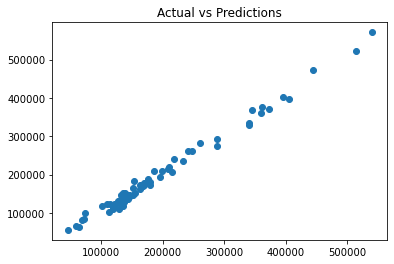

Train 

MAE: 7894.694223185128
MAPE: 0.04318130376731383
MSE: 245996535.69186252
RMSE: 15684.27670285954
R2 Score: 0.9853097657214235
Test 

MAE: 9060.791525416838
MAPE: 0.05838443082458992
MSE: 140432083.0414055
RMSE: 11850.404340840252
R2 Score: 0.9868706512430819


In [315]:
predictions(stack)

#### Conclusion:
* Voting Regressor consist of Elastic Net and Cat Boost Regressor which gave better RMSE score of 11850 and R2 score of 0.98.